# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [13]:
data_dir = './data'

#FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

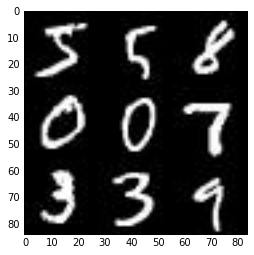

In [14]:
show_n_images = 9

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

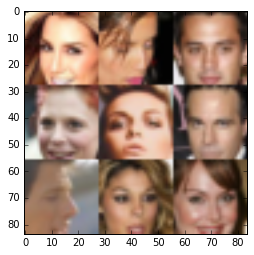

In [15]:
show_n_images = 9

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [16]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1


/anaconda/envs/dlnd-tf-lab2/lib/python3.5/site-packages/ipykernel_launcher.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.
  


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [17]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32,(None,image_width,image_height,image_channels),name='real')
    input_z = tf.placeholder(tf.float32,(None,z_dim),name='z')
    learningRate = tf.placeholder(tf.float32,name='lr')
    return input_real, input_z, learningRate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/anaconda/envs/dlnd-tf-lab2/lib/python3.5/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/anaconda/envs/dlnd-tf-lab2/lib/python3.5/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/anaconda/envs/dlnd-tf-lab2/lib/python3.5/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/anaconda/envs/dlnd-tf-lab2/lib/python3.5/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/anaconda/envs/dlnd-tf-lab2/lib/python3.5/site-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "/anaconda/envs/dlnd-tf-lab2/lib/python3

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [18]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28*28*3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(0.2 * x1, x1)
        #14*14*64
        #print("the dimension of images is {}.",x1.shape)
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(0.2 * bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(0.2 * bn3, bn3)
        ## Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        output = tf.sigmoid(logits)
    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [19]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
  
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 2*2*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        #x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(0.2 * x1, x1)
        # 2x2x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(0.2 * x2, x2) #
        # 4x4x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(0.2 * x3, x3)
        # 16x16x128 now
        
        # Output layer
        x4 = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        #x4 = tf.image.resize_images(x4,(28,28))
        output = tf.tanh(x4)
    return output
  


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""

tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [20]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.1
    g_model = generator(input_z, out_channel_dim,True)
    d_model_real, d_logits_real = discriminator(input_real)
    d_logits_real = d_logits_real #smoothing factor
    d_model_fake, d_logits_fake = discriminator(g_model,reuse=True)
    
    #calculate d_loss_real
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)* (1 - smooth)))
    #calculate d_loss_fake
    d_loss_fake = tf.reduce_mean(
    tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    #calculate g_loss
    g_loss = tf.reduce_mean(
    tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [21]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)): 
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [22]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [23]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    n_samples, width, height, channels = data_shape
    input_real, input_z, learn_rate = model_inputs(width, height, channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learn_rate, beta1)
    
    steps = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                batch_images *= 2
                # TODO: Train Model
                steps += 1
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})
                if steps % 50 == 0:
                    n_images = 16
                    show_generator_output(sess, n_images, input_z, channels, data_image_mode)

                if steps % 10 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
    

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 0/2... Discriminator Loss: 4.4593... Generator Loss: 0.0200
Epoch 0/2... Discriminator Loss: 0.3947... Generator Loss: 4.2423
Epoch 0/2... Discriminator Loss: 0.5154... Generator Loss: 12.2298
Epoch 0/2... Discriminator Loss: 0.6224... Generator Loss: 2.8419


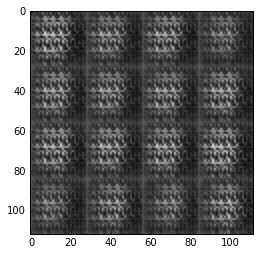

Epoch 0/2... Discriminator Loss: 0.5519... Generator Loss: 5.7361
Epoch 0/2... Discriminator Loss: 0.4525... Generator Loss: 6.1377
Epoch 0/2... Discriminator Loss: 1.2074... Generator Loss: 2.2766
Epoch 0/2... Discriminator Loss: 0.8271... Generator Loss: 2.9071
Epoch 0/2... Discriminator Loss: 0.4413... Generator Loss: 4.0656


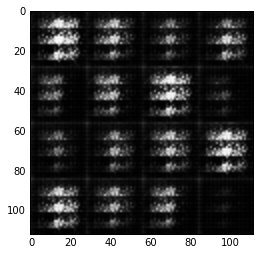

Epoch 0/2... Discriminator Loss: 0.4727... Generator Loss: 2.4271
Epoch 0/2... Discriminator Loss: 0.4682... Generator Loss: 2.6825
Epoch 0/2... Discriminator Loss: 0.4176... Generator Loss: 3.7493
Epoch 0/2... Discriminator Loss: 0.5013... Generator Loss: 2.6102
Epoch 0/2... Discriminator Loss: 0.4821... Generator Loss: 2.8021


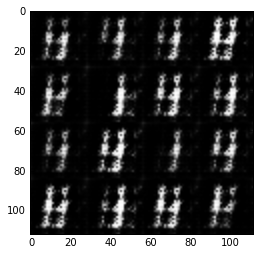

Epoch 0/2... Discriminator Loss: 0.4961... Generator Loss: 3.4734
Epoch 0/2... Discriminator Loss: 0.6428... Generator Loss: 1.7650
Epoch 0/2... Discriminator Loss: 0.5235... Generator Loss: 2.6790
Epoch 0/2... Discriminator Loss: 0.4111... Generator Loss: 4.2856
Epoch 0/2... Discriminator Loss: 0.4486... Generator Loss: 2.6223


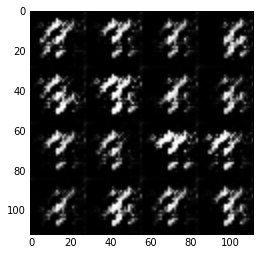

Epoch 0/2... Discriminator Loss: 0.4675... Generator Loss: 2.4641
Epoch 0/2... Discriminator Loss: 0.4499... Generator Loss: 2.9139
Epoch 0/2... Discriminator Loss: 0.6893... Generator Loss: 2.3779
Epoch 0/2... Discriminator Loss: 0.7343... Generator Loss: 1.3955
Epoch 0/2... Discriminator Loss: 0.4967... Generator Loss: 3.7327


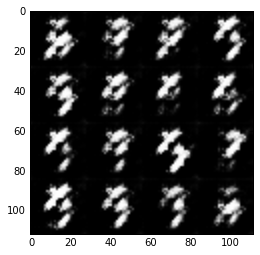

Epoch 0/2... Discriminator Loss: 0.4422... Generator Loss: 3.0950
Epoch 0/2... Discriminator Loss: 0.5575... Generator Loss: 2.4989
Epoch 0/2... Discriminator Loss: 0.9593... Generator Loss: 6.3162
Epoch 0/2... Discriminator Loss: 0.4074... Generator Loss: 3.3578
Epoch 0/2... Discriminator Loss: 0.4694... Generator Loss: 2.5584


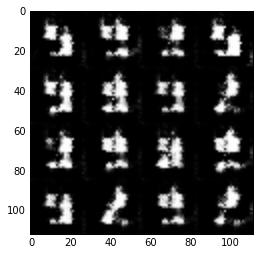

Epoch 0/2... Discriminator Loss: 0.4337... Generator Loss: 4.2389
Epoch 0/2... Discriminator Loss: 0.4886... Generator Loss: 3.3215
Epoch 0/2... Discriminator Loss: 0.5008... Generator Loss: 4.2577
Epoch 0/2... Discriminator Loss: 0.5168... Generator Loss: 2.5230
Epoch 0/2... Discriminator Loss: 0.7064... Generator Loss: 2.3281


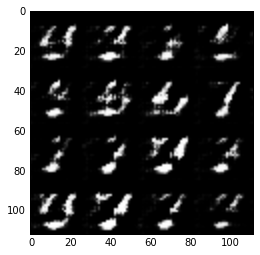

Epoch 0/2... Discriminator Loss: 0.5012... Generator Loss: 4.5556
Epoch 0/2... Discriminator Loss: 0.5655... Generator Loss: 2.2439
Epoch 0/2... Discriminator Loss: 0.4767... Generator Loss: 3.5907
Epoch 0/2... Discriminator Loss: 0.4816... Generator Loss: 3.1121
Epoch 0/2... Discriminator Loss: 1.0180... Generator Loss: 1.0448


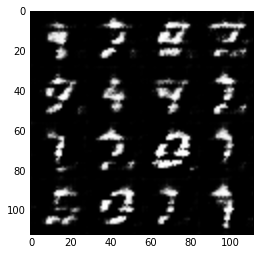

Epoch 0/2... Discriminator Loss: 0.5317... Generator Loss: 2.2879
Epoch 0/2... Discriminator Loss: 0.4882... Generator Loss: 2.7420
Epoch 0/2... Discriminator Loss: 0.5650... Generator Loss: 2.4696
Epoch 0/2... Discriminator Loss: 0.8259... Generator Loss: 4.4506
Epoch 0/2... Discriminator Loss: 0.5833... Generator Loss: 2.7455


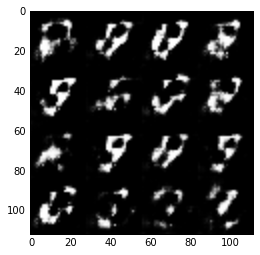

Epoch 0/2... Discriminator Loss: 0.6333... Generator Loss: 1.9597
Epoch 0/2... Discriminator Loss: 0.8413... Generator Loss: 1.2328
Epoch 0/2... Discriminator Loss: 0.6407... Generator Loss: 1.9704
Epoch 0/2... Discriminator Loss: 0.9093... Generator Loss: 1.3423
Epoch 0/2... Discriminator Loss: 0.6975... Generator Loss: 2.0304


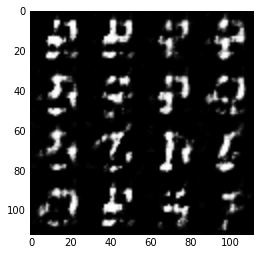

Epoch 0/2... Discriminator Loss: 0.7697... Generator Loss: 1.6204
Epoch 0/2... Discriminator Loss: 0.8400... Generator Loss: 1.7846
Epoch 0/2... Discriminator Loss: 1.0721... Generator Loss: 1.1038
Epoch 0/2... Discriminator Loss: 0.7665... Generator Loss: 2.4536
Epoch 0/2... Discriminator Loss: 0.9342... Generator Loss: 1.2579


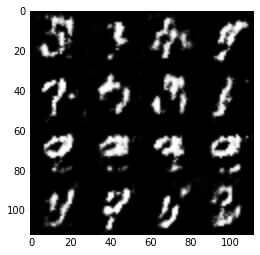

Epoch 0/2... Discriminator Loss: 1.0735... Generator Loss: 2.8679
Epoch 0/2... Discriminator Loss: 0.8213... Generator Loss: 1.6552
Epoch 0/2... Discriminator Loss: 0.9681... Generator Loss: 1.1395
Epoch 0/2... Discriminator Loss: 0.7918... Generator Loss: 1.4029
Epoch 0/2... Discriminator Loss: 0.7293... Generator Loss: 1.8673


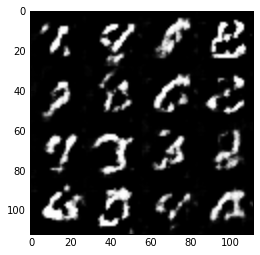

Epoch 0/2... Discriminator Loss: 0.7654... Generator Loss: 3.1352
Epoch 0/2... Discriminator Loss: 0.6757... Generator Loss: 2.0118
Epoch 0/2... Discriminator Loss: 0.6589... Generator Loss: 2.1162
Epoch 0/2... Discriminator Loss: 1.1326... Generator Loss: 0.8361
Epoch 0/2... Discriminator Loss: 0.7122... Generator Loss: 2.3695


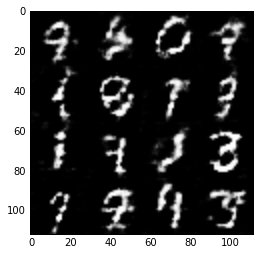

Epoch 0/2... Discriminator Loss: 0.7664... Generator Loss: 2.0917
Epoch 0/2... Discriminator Loss: 0.9549... Generator Loss: 1.1700
Epoch 0/2... Discriminator Loss: 0.8358... Generator Loss: 1.6536
Epoch 0/2... Discriminator Loss: 0.8226... Generator Loss: 1.6505
Epoch 0/2... Discriminator Loss: 0.9241... Generator Loss: 1.7256


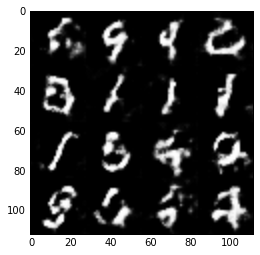

Epoch 0/2... Discriminator Loss: 0.9231... Generator Loss: 1.4637
Epoch 0/2... Discriminator Loss: 1.0141... Generator Loss: 1.0660
Epoch 0/2... Discriminator Loss: 0.7771... Generator Loss: 1.5369
Epoch 0/2... Discriminator Loss: 0.8116... Generator Loss: 2.0312
Epoch 0/2... Discriminator Loss: 0.7581... Generator Loss: 1.9583


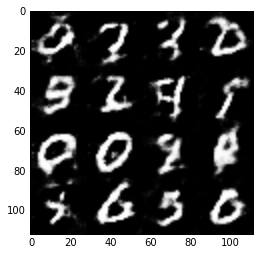

Epoch 0/2... Discriminator Loss: 0.8847... Generator Loss: 1.0507
Epoch 0/2... Discriminator Loss: 0.7273... Generator Loss: 1.5992
Epoch 0/2... Discriminator Loss: 0.7006... Generator Loss: 1.9399
Epoch 0/2... Discriminator Loss: 1.0568... Generator Loss: 0.8834
Epoch 0/2... Discriminator Loss: 1.0234... Generator Loss: 0.9373


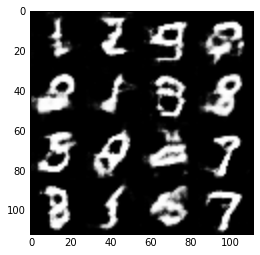

Epoch 0/2... Discriminator Loss: 0.9053... Generator Loss: 1.9248
Epoch 0/2... Discriminator Loss: 0.7548... Generator Loss: 1.4807
Epoch 0/2... Discriminator Loss: 0.7630... Generator Loss: 1.5781
Epoch 0/2... Discriminator Loss: 0.9165... Generator Loss: 1.0655
Epoch 0/2... Discriminator Loss: 0.7506... Generator Loss: 2.6155


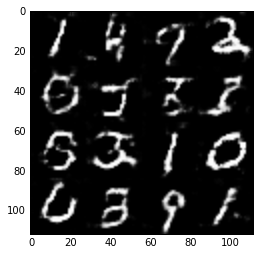

Epoch 0/2... Discriminator Loss: 0.9790... Generator Loss: 1.0493
Epoch 0/2... Discriminator Loss: 1.0775... Generator Loss: 1.0531
Epoch 0/2... Discriminator Loss: 1.2590... Generator Loss: 1.9413
Epoch 0/2... Discriminator Loss: 0.8148... Generator Loss: 1.6897
Epoch 0/2... Discriminator Loss: 1.0785... Generator Loss: 2.4452


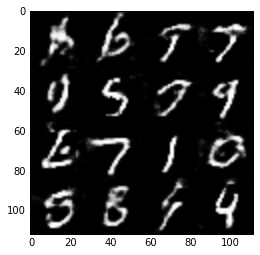

Epoch 0/2... Discriminator Loss: 0.7845... Generator Loss: 1.7574
Epoch 0/2... Discriminator Loss: 0.8194... Generator Loss: 1.5016
Epoch 0/2... Discriminator Loss: 0.7731... Generator Loss: 1.7481
Epoch 0/2... Discriminator Loss: 0.8251... Generator Loss: 1.7029
Epoch 1/2... Discriminator Loss: 0.8549... Generator Loss: 1.2176


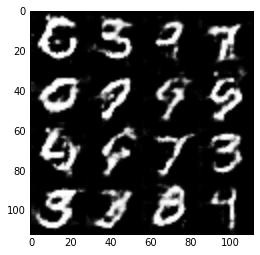

Epoch 1/2... Discriminator Loss: 0.8371... Generator Loss: 1.2791
Epoch 1/2... Discriminator Loss: 0.9356... Generator Loss: 1.1670
Epoch 1/2... Discriminator Loss: 0.9651... Generator Loss: 1.4812
Epoch 1/2... Discriminator Loss: 0.9513... Generator Loss: 1.1813
Epoch 1/2... Discriminator Loss: 0.9390... Generator Loss: 1.5033


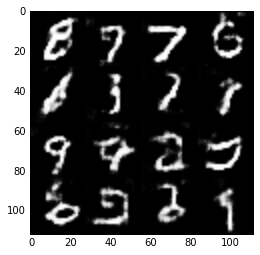

Epoch 1/2... Discriminator Loss: 1.0705... Generator Loss: 0.8750
Epoch 1/2... Discriminator Loss: 0.8599... Generator Loss: 1.4898
Epoch 1/2... Discriminator Loss: 0.7330... Generator Loss: 1.8485
Epoch 1/2... Discriminator Loss: 0.7971... Generator Loss: 1.2502
Epoch 1/2... Discriminator Loss: 0.9312... Generator Loss: 1.1258


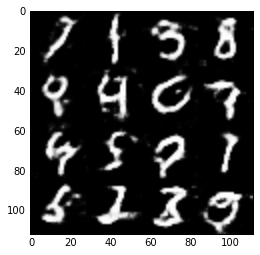

Epoch 1/2... Discriminator Loss: 0.8794... Generator Loss: 2.1596
Epoch 1/2... Discriminator Loss: 1.0260... Generator Loss: 0.9942
Epoch 1/2... Discriminator Loss: 0.9549... Generator Loss: 1.0041
Epoch 1/2... Discriminator Loss: 0.9821... Generator Loss: 1.3958
Epoch 1/2... Discriminator Loss: 1.1838... Generator Loss: 0.7152


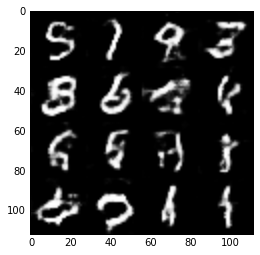

Epoch 1/2... Discriminator Loss: 1.5708... Generator Loss: 0.4592
Epoch 1/2... Discriminator Loss: 0.7794... Generator Loss: 1.5561
Epoch 1/2... Discriminator Loss: 0.8951... Generator Loss: 1.2326
Epoch 1/2... Discriminator Loss: 1.2274... Generator Loss: 3.2139
Epoch 1/2... Discriminator Loss: 0.8824... Generator Loss: 1.8022


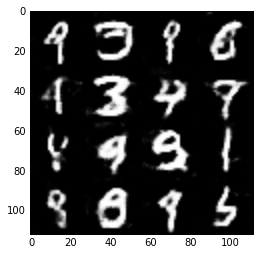

Epoch 1/2... Discriminator Loss: 0.9730... Generator Loss: 0.9355
Epoch 1/2... Discriminator Loss: 1.3482... Generator Loss: 0.5616
Epoch 1/2... Discriminator Loss: 0.9426... Generator Loss: 1.0736
Epoch 1/2... Discriminator Loss: 1.0104... Generator Loss: 0.9264
Epoch 1/2... Discriminator Loss: 1.2252... Generator Loss: 0.7242


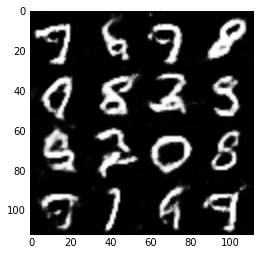

Epoch 1/2... Discriminator Loss: 0.8759... Generator Loss: 1.4660
Epoch 1/2... Discriminator Loss: 1.1523... Generator Loss: 0.7242
Epoch 1/2... Discriminator Loss: 0.7082... Generator Loss: 1.5496
Epoch 1/2... Discriminator Loss: 1.2846... Generator Loss: 0.7435
Epoch 1/2... Discriminator Loss: 0.8349... Generator Loss: 1.4806


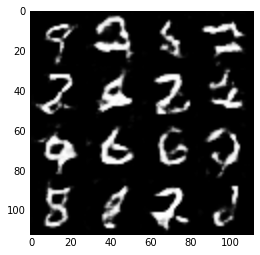

Epoch 1/2... Discriminator Loss: 0.8715... Generator Loss: 1.2685
Epoch 1/2... Discriminator Loss: 0.9023... Generator Loss: 1.1720
Epoch 1/2... Discriminator Loss: 0.8245... Generator Loss: 1.5400
Epoch 1/2... Discriminator Loss: 1.0107... Generator Loss: 0.9798
Epoch 1/2... Discriminator Loss: 0.8369... Generator Loss: 1.2147


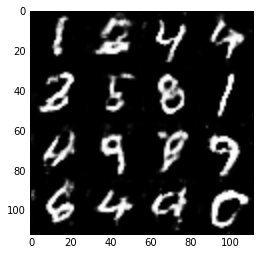

Epoch 1/2... Discriminator Loss: 3.1061... Generator Loss: 4.9245
Epoch 1/2... Discriminator Loss: 0.9318... Generator Loss: 1.0370
Epoch 1/2... Discriminator Loss: 0.9418... Generator Loss: 1.1244
Epoch 1/2... Discriminator Loss: 0.8519... Generator Loss: 1.2977
Epoch 1/2... Discriminator Loss: 0.7920... Generator Loss: 1.5309


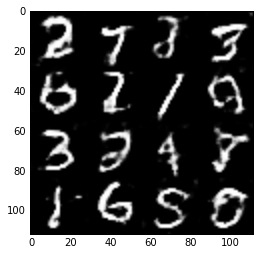

Epoch 1/2... Discriminator Loss: 2.2967... Generator Loss: 0.2248
Epoch 1/2... Discriminator Loss: 0.8643... Generator Loss: 1.8349
Epoch 1/2... Discriminator Loss: 0.8840... Generator Loss: 1.7269
Epoch 1/2... Discriminator Loss: 0.7971... Generator Loss: 1.2887
Epoch 1/2... Discriminator Loss: 0.7924... Generator Loss: 1.6564


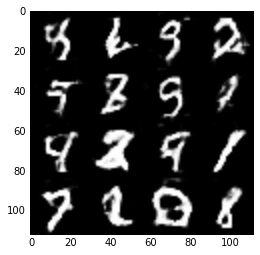

Epoch 1/2... Discriminator Loss: 0.9135... Generator Loss: 1.6062
Epoch 1/2... Discriminator Loss: 1.2164... Generator Loss: 0.7081
Epoch 1/2... Discriminator Loss: 0.9863... Generator Loss: 1.4920
Epoch 1/2... Discriminator Loss: 0.9503... Generator Loss: 0.9384
Epoch 1/2... Discriminator Loss: 0.6961... Generator Loss: 1.5163


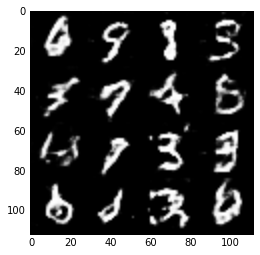

Epoch 1/2... Discriminator Loss: 0.9061... Generator Loss: 1.8760
Epoch 1/2... Discriminator Loss: 1.2585... Generator Loss: 0.7619
Epoch 1/2... Discriminator Loss: 1.0901... Generator Loss: 1.1670
Epoch 1/2... Discriminator Loss: 0.8525... Generator Loss: 1.2658
Epoch 1/2... Discriminator Loss: 0.7968... Generator Loss: 1.2346


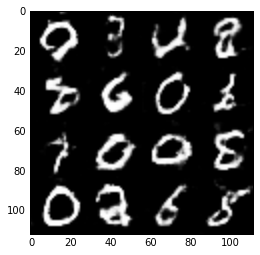

Epoch 1/2... Discriminator Loss: 1.5551... Generator Loss: 0.4676
Epoch 1/2... Discriminator Loss: 0.9535... Generator Loss: 0.9263
Epoch 1/2... Discriminator Loss: 0.7642... Generator Loss: 1.3199
Epoch 1/2... Discriminator Loss: 0.6215... Generator Loss: 1.6710
Epoch 1/2... Discriminator Loss: 0.6455... Generator Loss: 1.7412


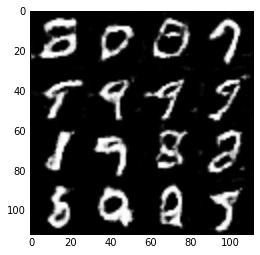

Epoch 1/2... Discriminator Loss: 1.6372... Generator Loss: 3.4930
Epoch 1/2... Discriminator Loss: 0.9776... Generator Loss: 1.6689
Epoch 1/2... Discriminator Loss: 1.1123... Generator Loss: 0.7561
Epoch 1/2... Discriminator Loss: 0.8967... Generator Loss: 1.2359
Epoch 1/2... Discriminator Loss: 1.0610... Generator Loss: 2.2041


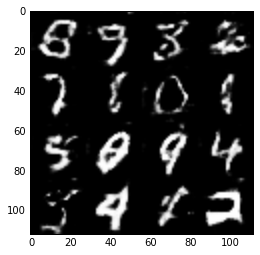

Epoch 1/2... Discriminator Loss: 1.9639... Generator Loss: 0.3392
Epoch 1/2... Discriminator Loss: 1.0545... Generator Loss: 1.0217
Epoch 1/2... Discriminator Loss: 0.9259... Generator Loss: 1.5615
Epoch 1/2... Discriminator Loss: 1.2105... Generator Loss: 2.4297
Epoch 1/2... Discriminator Loss: 1.3629... Generator Loss: 0.5632


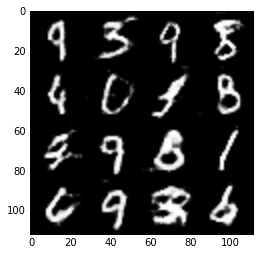

Epoch 1/2... Discriminator Loss: 1.0471... Generator Loss: 0.8444
Epoch 1/2... Discriminator Loss: 0.7344... Generator Loss: 1.4689
Epoch 1/2... Discriminator Loss: 0.9847... Generator Loss: 0.9168
Epoch 1/2... Discriminator Loss: 0.9087... Generator Loss: 1.3147
Epoch 1/2... Discriminator Loss: 1.3715... Generator Loss: 0.5725


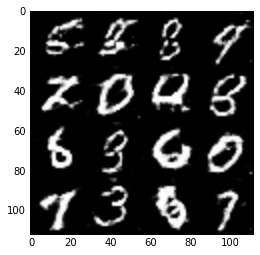

Epoch 1/2... Discriminator Loss: 1.3100... Generator Loss: 0.5511
Epoch 1/2... Discriminator Loss: 1.8779... Generator Loss: 0.3519
Epoch 1/2... Discriminator Loss: 0.7630... Generator Loss: 1.3617
Epoch 1/2... Discriminator Loss: 1.5095... Generator Loss: 0.5234
Epoch 1/2... Discriminator Loss: 0.8381... Generator Loss: 1.3608


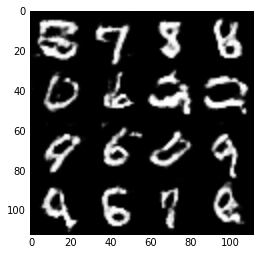

Epoch 1/2... Discriminator Loss: 0.8285... Generator Loss: 1.5156
Epoch 1/2... Discriminator Loss: 0.7514... Generator Loss: 1.5217
Epoch 1/2... Discriminator Loss: 0.9107... Generator Loss: 1.0882
Epoch 1/2... Discriminator Loss: 1.5682... Generator Loss: 0.5193
Epoch 1/2... Discriminator Loss: 0.8503... Generator Loss: 1.1095


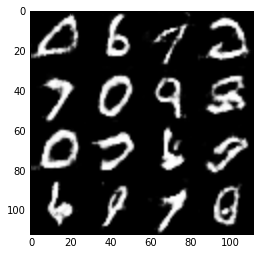

Epoch 1/2... Discriminator Loss: 1.3081... Generator Loss: 0.9618
Epoch 1/2... Discriminator Loss: 1.0637... Generator Loss: 1.0820
Epoch 1/2... Discriminator Loss: 1.2659... Generator Loss: 0.5898
Epoch 1/2... Discriminator Loss: 0.8700... Generator Loss: 1.2266
Epoch 1/2... Discriminator Loss: 0.8389... Generator Loss: 1.4326


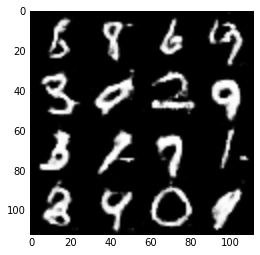

Epoch 1/2... Discriminator Loss: 0.8649... Generator Loss: 1.3393
Epoch 1/2... Discriminator Loss: 1.2255... Generator Loss: 2.4556
Epoch 1/2... Discriminator Loss: 0.9770... Generator Loss: 1.0038


In [24]:
batch_size = 64
z_dim = 100
learning_rate = 0.0004
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 0/1... Discriminator Loss: 1.8941... Generator Loss: 0.3420
Epoch 0/1... Discriminator Loss: 1.0649... Generator Loss: 1.0863
Epoch 0/1... Discriminator Loss: 0.9611... Generator Loss: 1.2237
Epoch 0/1... Discriminator Loss: 0.6584... Generator Loss: 1.7722


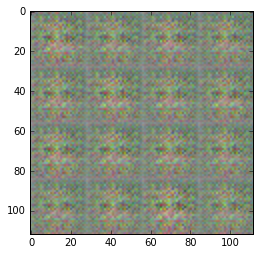

Epoch 0/1... Discriminator Loss: 0.7001... Generator Loss: 1.5854
Epoch 0/1... Discriminator Loss: 0.6257... Generator Loss: 2.0448
Epoch 0/1... Discriminator Loss: 0.5171... Generator Loss: 2.2357
Epoch 0/1... Discriminator Loss: 0.4479... Generator Loss: 3.0808
Epoch 0/1... Discriminator Loss: 0.5316... Generator Loss: 2.1651


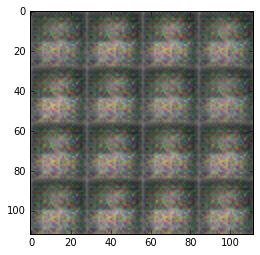

Epoch 0/1... Discriminator Loss: 0.4763... Generator Loss: 2.4266
Epoch 0/1... Discriminator Loss: 0.5710... Generator Loss: 4.8378
Epoch 0/1... Discriminator Loss: 0.5083... Generator Loss: 2.5151
Epoch 0/1... Discriminator Loss: 0.4845... Generator Loss: 3.0547
Epoch 0/1... Discriminator Loss: 0.3961... Generator Loss: 3.7885


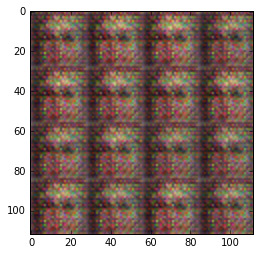

Epoch 0/1... Discriminator Loss: 0.4761... Generator Loss: 2.2418
Epoch 0/1... Discriminator Loss: 0.4112... Generator Loss: 3.3704
Epoch 0/1... Discriminator Loss: 0.3987... Generator Loss: 3.1271
Epoch 0/1... Discriminator Loss: 0.4096... Generator Loss: 3.4462
Epoch 0/1... Discriminator Loss: 0.5759... Generator Loss: 1.7864


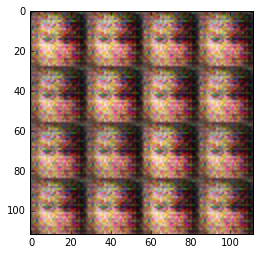

Epoch 0/1... Discriminator Loss: 0.4716... Generator Loss: 3.0243
Epoch 0/1... Discriminator Loss: 0.4263... Generator Loss: 3.1463
Epoch 0/1... Discriminator Loss: 0.5089... Generator Loss: 5.7986
Epoch 0/1... Discriminator Loss: 0.3999... Generator Loss: 4.3505
Epoch 0/1... Discriminator Loss: 0.4472... Generator Loss: 2.9444


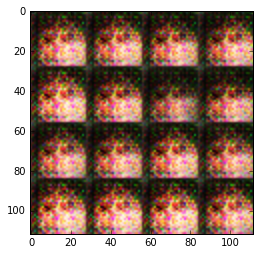

Epoch 0/1... Discriminator Loss: 0.3837... Generator Loss: 6.0564
Epoch 0/1... Discriminator Loss: 0.4123... Generator Loss: 3.0797
Epoch 0/1... Discriminator Loss: 0.4661... Generator Loss: 2.3992
Epoch 0/1... Discriminator Loss: 0.5027... Generator Loss: 2.6660
Epoch 0/1... Discriminator Loss: 0.4486... Generator Loss: 2.7408


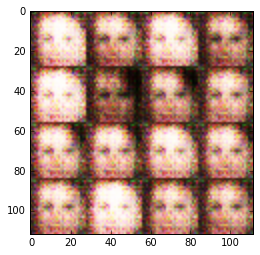

Epoch 0/1... Discriminator Loss: 0.6819... Generator Loss: 1.8328
Epoch 0/1... Discriminator Loss: 0.6971... Generator Loss: 1.3798
Epoch 0/1... Discriminator Loss: 0.6130... Generator Loss: 1.8839
Epoch 0/1... Discriminator Loss: 0.5622... Generator Loss: 2.2273
Epoch 0/1... Discriminator Loss: 0.5750... Generator Loss: 2.6183


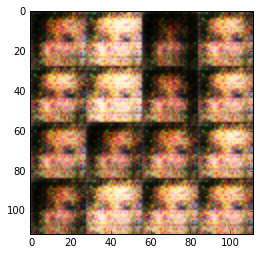

Epoch 0/1... Discriminator Loss: 0.5283... Generator Loss: 2.4792
Epoch 0/1... Discriminator Loss: 0.5239... Generator Loss: 2.9048
Epoch 0/1... Discriminator Loss: 0.6207... Generator Loss: 1.6811
Epoch 0/1... Discriminator Loss: 0.5502... Generator Loss: 2.9948
Epoch 0/1... Discriminator Loss: 0.6456... Generator Loss: 1.9941


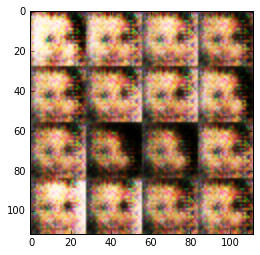

Epoch 0/1... Discriminator Loss: 0.5969... Generator Loss: 2.4182
Epoch 0/1... Discriminator Loss: 0.6034... Generator Loss: 2.2215
Epoch 0/1... Discriminator Loss: 0.6419... Generator Loss: 2.8096
Epoch 0/1... Discriminator Loss: 0.5887... Generator Loss: 1.9077
Epoch 0/1... Discriminator Loss: 0.9267... Generator Loss: 1.1475


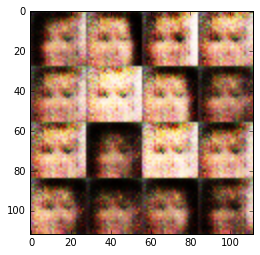

Epoch 0/1... Discriminator Loss: 0.6867... Generator Loss: 2.0953
Epoch 0/1... Discriminator Loss: 0.6323... Generator Loss: 2.0008
Epoch 0/1... Discriminator Loss: 0.9923... Generator Loss: 0.9348
Epoch 0/1... Discriminator Loss: 0.6304... Generator Loss: 1.6649
Epoch 0/1... Discriminator Loss: 0.6981... Generator Loss: 1.5931


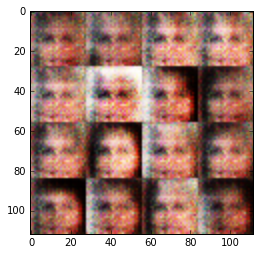

Epoch 0/1... Discriminator Loss: 0.9901... Generator Loss: 1.2214
Epoch 0/1... Discriminator Loss: 1.1439... Generator Loss: 0.8384
Epoch 0/1... Discriminator Loss: 0.9305... Generator Loss: 2.5631
Epoch 0/1... Discriminator Loss: 0.9022... Generator Loss: 1.3949
Epoch 0/1... Discriminator Loss: 1.0382... Generator Loss: 1.1391


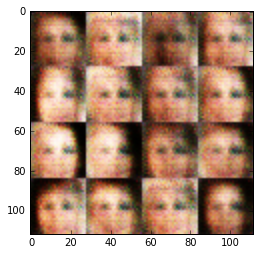

Epoch 0/1... Discriminator Loss: 0.7663... Generator Loss: 1.8626
Epoch 0/1... Discriminator Loss: 0.9364... Generator Loss: 1.1320
Epoch 0/1... Discriminator Loss: 1.4635... Generator Loss: 0.4838
Epoch 0/1... Discriminator Loss: 0.7764... Generator Loss: 1.6965
Epoch 0/1... Discriminator Loss: 0.8948... Generator Loss: 1.4372


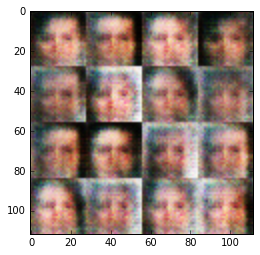

Epoch 0/1... Discriminator Loss: 0.7783... Generator Loss: 1.7906
Epoch 0/1... Discriminator Loss: 0.9362... Generator Loss: 2.0205
Epoch 0/1... Discriminator Loss: 0.7867... Generator Loss: 1.4731
Epoch 0/1... Discriminator Loss: 0.8125... Generator Loss: 1.3146
Epoch 0/1... Discriminator Loss: 0.8674... Generator Loss: 1.3390


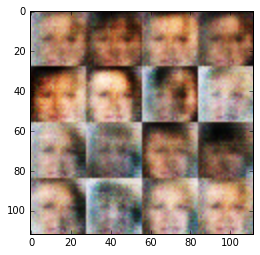

Epoch 0/1... Discriminator Loss: 0.9611... Generator Loss: 1.1758
Epoch 0/1... Discriminator Loss: 0.8851... Generator Loss: 1.6372
Epoch 0/1... Discriminator Loss: 1.1135... Generator Loss: 0.8458
Epoch 0/1... Discriminator Loss: 0.7825... Generator Loss: 1.4355
Epoch 0/1... Discriminator Loss: 0.7808... Generator Loss: 1.9786


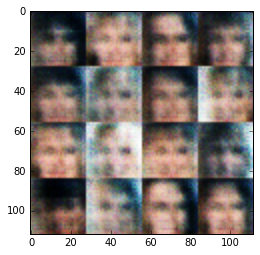

Epoch 0/1... Discriminator Loss: 0.6505... Generator Loss: 2.3179
Epoch 0/1... Discriminator Loss: 0.6583... Generator Loss: 1.7002
Epoch 0/1... Discriminator Loss: 0.9560... Generator Loss: 1.4027
Epoch 0/1... Discriminator Loss: 1.0701... Generator Loss: 0.9062
Epoch 0/1... Discriminator Loss: 0.8594... Generator Loss: 1.8909


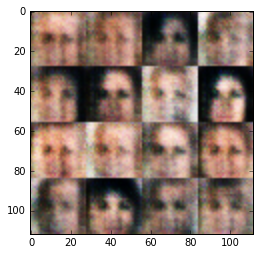

Epoch 0/1... Discriminator Loss: 0.7373... Generator Loss: 1.7243
Epoch 0/1... Discriminator Loss: 0.9538... Generator Loss: 1.0635
Epoch 0/1... Discriminator Loss: 1.0763... Generator Loss: 1.3097
Epoch 0/1... Discriminator Loss: 1.1500... Generator Loss: 2.1917
Epoch 0/1... Discriminator Loss: 1.0608... Generator Loss: 1.4673


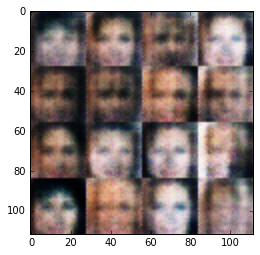

Epoch 0/1... Discriminator Loss: 0.8503... Generator Loss: 1.5128
Epoch 0/1... Discriminator Loss: 0.9966... Generator Loss: 1.0276
Epoch 0/1... Discriminator Loss: 1.0484... Generator Loss: 1.0437
Epoch 0/1... Discriminator Loss: 0.9073... Generator Loss: 1.3258
Epoch 0/1... Discriminator Loss: 0.9631... Generator Loss: 1.1406


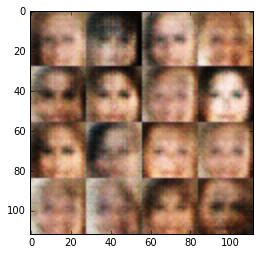

Epoch 0/1... Discriminator Loss: 0.8896... Generator Loss: 1.9798
Epoch 0/1... Discriminator Loss: 0.9845... Generator Loss: 1.0245
Epoch 0/1... Discriminator Loss: 0.8198... Generator Loss: 1.4827
Epoch 0/1... Discriminator Loss: 1.0285... Generator Loss: 1.0773
Epoch 0/1... Discriminator Loss: 0.8963... Generator Loss: 1.5137


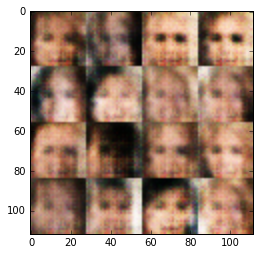

Epoch 0/1... Discriminator Loss: 1.2290... Generator Loss: 0.7681
Epoch 0/1... Discriminator Loss: 1.0329... Generator Loss: 1.8523
Epoch 0/1... Discriminator Loss: 1.0482... Generator Loss: 1.4127
Epoch 0/1... Discriminator Loss: 0.8687... Generator Loss: 1.2238
Epoch 0/1... Discriminator Loss: 1.4045... Generator Loss: 0.7442


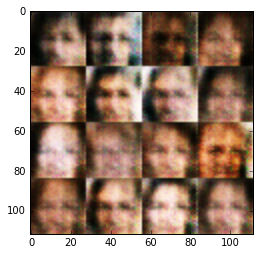

Epoch 0/1... Discriminator Loss: 1.1379... Generator Loss: 1.2701
Epoch 0/1... Discriminator Loss: 0.9810... Generator Loss: 1.4683
Epoch 0/1... Discriminator Loss: 1.1156... Generator Loss: 0.9415
Epoch 0/1... Discriminator Loss: 1.2057... Generator Loss: 1.1991
Epoch 0/1... Discriminator Loss: 0.8572... Generator Loss: 1.6872


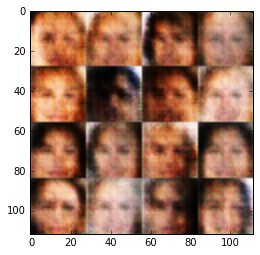

Epoch 0/1... Discriminator Loss: 1.1097... Generator Loss: 0.8537
Epoch 0/1... Discriminator Loss: 0.9975... Generator Loss: 1.1015
Epoch 0/1... Discriminator Loss: 1.3225... Generator Loss: 0.6387
Epoch 0/1... Discriminator Loss: 0.8375... Generator Loss: 1.5806
Epoch 0/1... Discriminator Loss: 1.2257... Generator Loss: 1.3026


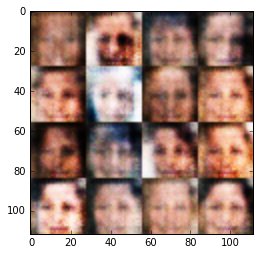

Epoch 0/1... Discriminator Loss: 1.0943... Generator Loss: 1.3154
Epoch 0/1... Discriminator Loss: 0.9440... Generator Loss: 1.0508
Epoch 0/1... Discriminator Loss: 0.9737... Generator Loss: 1.6985
Epoch 0/1... Discriminator Loss: 0.9864... Generator Loss: 1.0965
Epoch 0/1... Discriminator Loss: 1.1859... Generator Loss: 1.0025


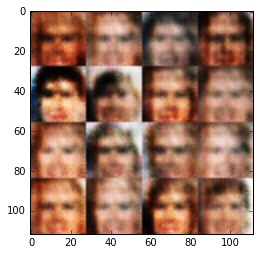

Epoch 0/1... Discriminator Loss: 1.1400... Generator Loss: 1.4239
Epoch 0/1... Discriminator Loss: 1.2039... Generator Loss: 0.9782
Epoch 0/1... Discriminator Loss: 1.0025... Generator Loss: 1.2106
Epoch 0/1... Discriminator Loss: 1.3325... Generator Loss: 1.0834
Epoch 0/1... Discriminator Loss: 1.2381... Generator Loss: 0.8968


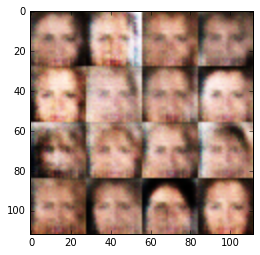

Epoch 0/1... Discriminator Loss: 1.2194... Generator Loss: 0.9494
Epoch 0/1... Discriminator Loss: 1.1690... Generator Loss: 1.0010
Epoch 0/1... Discriminator Loss: 1.0937... Generator Loss: 1.1820
Epoch 0/1... Discriminator Loss: 1.1119... Generator Loss: 0.9569
Epoch 0/1... Discriminator Loss: 1.1451... Generator Loss: 1.4376


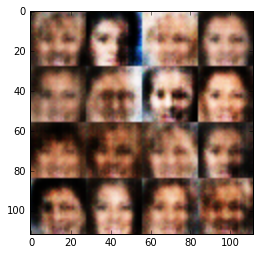

Epoch 0/1... Discriminator Loss: 1.0348... Generator Loss: 0.9559
Epoch 0/1... Discriminator Loss: 1.0480... Generator Loss: 1.2237
Epoch 0/1... Discriminator Loss: 1.1269... Generator Loss: 0.9636
Epoch 0/1... Discriminator Loss: 0.9845... Generator Loss: 1.3267
Epoch 0/1... Discriminator Loss: 0.9739... Generator Loss: 1.4026


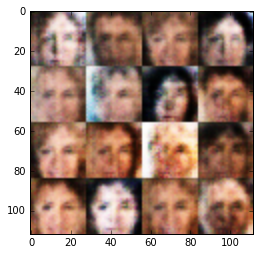

Epoch 0/1... Discriminator Loss: 1.1363... Generator Loss: 0.8572
Epoch 0/1... Discriminator Loss: 1.0585... Generator Loss: 1.1638
Epoch 0/1... Discriminator Loss: 1.3025... Generator Loss: 1.9107
Epoch 0/1... Discriminator Loss: 1.1991... Generator Loss: 1.4557
Epoch 0/1... Discriminator Loss: 1.0223... Generator Loss: 1.1492


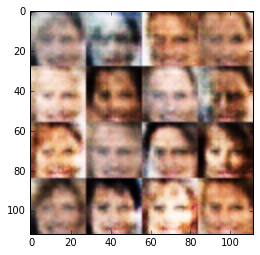

Epoch 0/1... Discriminator Loss: 0.9455... Generator Loss: 1.2791
Epoch 0/1... Discriminator Loss: 1.1194... Generator Loss: 1.0238
Epoch 0/1... Discriminator Loss: 1.0513... Generator Loss: 0.9387
Epoch 0/1... Discriminator Loss: 0.8717... Generator Loss: 1.3853
Epoch 0/1... Discriminator Loss: 1.3854... Generator Loss: 0.7205


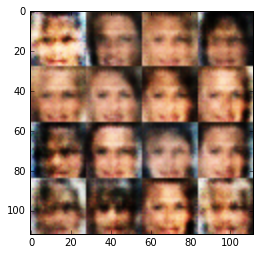

Epoch 0/1... Discriminator Loss: 1.0254... Generator Loss: 1.4299
Epoch 0/1... Discriminator Loss: 1.0538... Generator Loss: 1.2778
Epoch 0/1... Discriminator Loss: 1.3168... Generator Loss: 1.1962
Epoch 0/1... Discriminator Loss: 1.1050... Generator Loss: 1.5638
Epoch 0/1... Discriminator Loss: 1.0808... Generator Loss: 1.1891


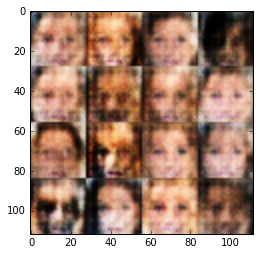

Epoch 0/1... Discriminator Loss: 1.1609... Generator Loss: 0.8199
Epoch 0/1... Discriminator Loss: 1.0253... Generator Loss: 1.0300
Epoch 0/1... Discriminator Loss: 1.0603... Generator Loss: 1.2922
Epoch 0/1... Discriminator Loss: 1.0222... Generator Loss: 1.3124
Epoch 0/1... Discriminator Loss: 1.1565... Generator Loss: 1.1454


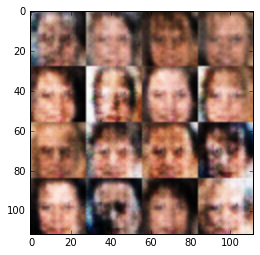

Epoch 0/1... Discriminator Loss: 1.0049... Generator Loss: 1.5349
Epoch 0/1... Discriminator Loss: 0.9424... Generator Loss: 1.1027
Epoch 0/1... Discriminator Loss: 1.2330... Generator Loss: 1.0770
Epoch 0/1... Discriminator Loss: 0.9666... Generator Loss: 1.4283
Epoch 0/1... Discriminator Loss: 1.1294... Generator Loss: 0.8308


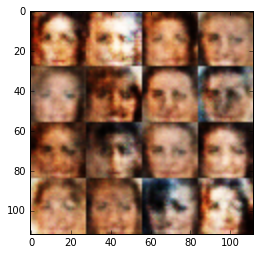

Epoch 0/1... Discriminator Loss: 1.2012... Generator Loss: 0.7930
Epoch 0/1... Discriminator Loss: 1.1570... Generator Loss: 0.9654
Epoch 0/1... Discriminator Loss: 1.0580... Generator Loss: 1.0277
Epoch 0/1... Discriminator Loss: 1.3679... Generator Loss: 0.5788
Epoch 0/1... Discriminator Loss: 1.0789... Generator Loss: 1.1619


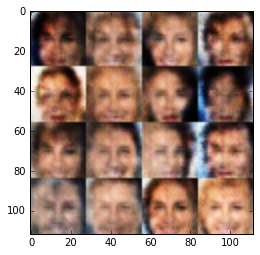

Epoch 0/1... Discriminator Loss: 1.0486... Generator Loss: 1.2444
Epoch 0/1... Discriminator Loss: 1.0699... Generator Loss: 1.2442
Epoch 0/1... Discriminator Loss: 1.0678... Generator Loss: 1.1612
Epoch 0/1... Discriminator Loss: 1.0755... Generator Loss: 0.9576
Epoch 0/1... Discriminator Loss: 1.0926... Generator Loss: 0.9009


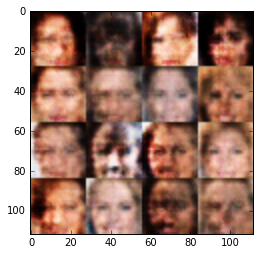

Epoch 0/1... Discriminator Loss: 1.1511... Generator Loss: 0.9028
Epoch 0/1... Discriminator Loss: 1.0192... Generator Loss: 1.0703
Epoch 0/1... Discriminator Loss: 1.1618... Generator Loss: 0.8511
Epoch 0/1... Discriminator Loss: 1.0325... Generator Loss: 0.9097
Epoch 0/1... Discriminator Loss: 1.0082... Generator Loss: 1.1398


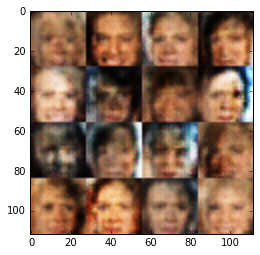

Epoch 0/1... Discriminator Loss: 1.1477... Generator Loss: 0.9216
Epoch 0/1... Discriminator Loss: 0.9937... Generator Loss: 1.3555
Epoch 0/1... Discriminator Loss: 0.8889... Generator Loss: 1.6102
Epoch 0/1... Discriminator Loss: 1.0761... Generator Loss: 1.1985
Epoch 0/1... Discriminator Loss: 1.1526... Generator Loss: 1.1085


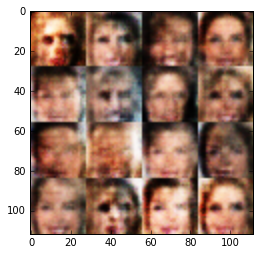

Epoch 0/1... Discriminator Loss: 1.0203... Generator Loss: 1.1139
Epoch 0/1... Discriminator Loss: 1.2336... Generator Loss: 1.0845
Epoch 0/1... Discriminator Loss: 1.2133... Generator Loss: 0.7979
Epoch 0/1... Discriminator Loss: 0.8748... Generator Loss: 1.3486
Epoch 0/1... Discriminator Loss: 1.1007... Generator Loss: 1.3867


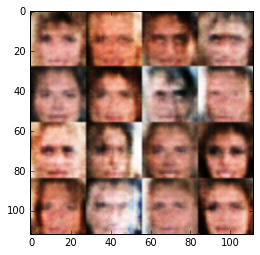

Epoch 0/1... Discriminator Loss: 0.9983... Generator Loss: 1.1948
Epoch 0/1... Discriminator Loss: 1.1410... Generator Loss: 1.3623
Epoch 0/1... Discriminator Loss: 1.1211... Generator Loss: 0.7576
Epoch 0/1... Discriminator Loss: 1.1888... Generator Loss: 0.8626
Epoch 0/1... Discriminator Loss: 1.0379... Generator Loss: 0.9848


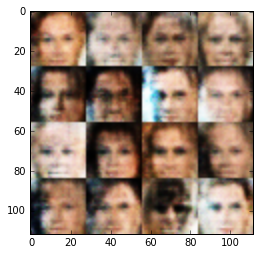

Epoch 0/1... Discriminator Loss: 1.1530... Generator Loss: 1.1227
Epoch 0/1... Discriminator Loss: 0.9591... Generator Loss: 1.4678
Epoch 0/1... Discriminator Loss: 0.8397... Generator Loss: 1.5486
Epoch 0/1... Discriminator Loss: 1.1618... Generator Loss: 0.9859
Epoch 0/1... Discriminator Loss: 1.0175... Generator Loss: 1.3908


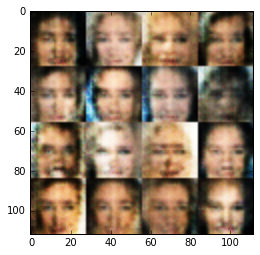

Epoch 0/1... Discriminator Loss: 0.9188... Generator Loss: 1.3164
Epoch 0/1... Discriminator Loss: 1.0366... Generator Loss: 1.0819
Epoch 0/1... Discriminator Loss: 0.9663... Generator Loss: 1.0944
Epoch 0/1... Discriminator Loss: 1.0726... Generator Loss: 1.0784
Epoch 0/1... Discriminator Loss: 1.0348... Generator Loss: 0.9210


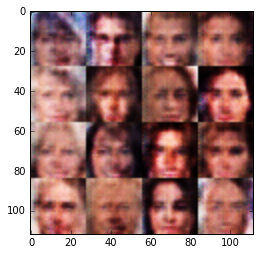

Epoch 0/1... Discriminator Loss: 1.1048... Generator Loss: 1.4074
Epoch 0/1... Discriminator Loss: 1.1642... Generator Loss: 0.9589
Epoch 0/1... Discriminator Loss: 1.1901... Generator Loss: 0.8981
Epoch 0/1... Discriminator Loss: 1.0677... Generator Loss: 1.1861
Epoch 0/1... Discriminator Loss: 1.1086... Generator Loss: 1.0542


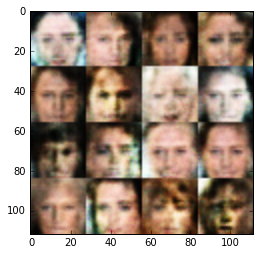

Epoch 0/1... Discriminator Loss: 1.0510... Generator Loss: 0.9440
Epoch 0/1... Discriminator Loss: 0.9921... Generator Loss: 1.3126
Epoch 0/1... Discriminator Loss: 0.9419... Generator Loss: 1.2554
Epoch 0/1... Discriminator Loss: 1.1269... Generator Loss: 0.9631
Epoch 0/1... Discriminator Loss: 0.9353... Generator Loss: 1.1259


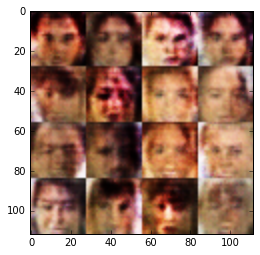

Epoch 0/1... Discriminator Loss: 1.0169... Generator Loss: 1.6164
Epoch 0/1... Discriminator Loss: 0.9936... Generator Loss: 1.1941
Epoch 0/1... Discriminator Loss: 1.0221... Generator Loss: 1.1586
Epoch 0/1... Discriminator Loss: 1.0014... Generator Loss: 1.1157
Epoch 0/1... Discriminator Loss: 0.9603... Generator Loss: 1.4301


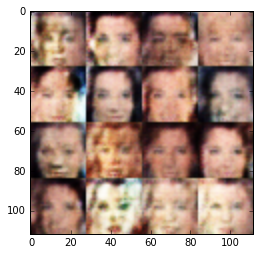

Epoch 0/1... Discriminator Loss: 0.8562... Generator Loss: 1.3662
Epoch 0/1... Discriminator Loss: 0.9842... Generator Loss: 1.1638
Epoch 0/1... Discriminator Loss: 1.1217... Generator Loss: 0.8679
Epoch 0/1... Discriminator Loss: 1.1002... Generator Loss: 1.0393
Epoch 0/1... Discriminator Loss: 1.0315... Generator Loss: 1.2906


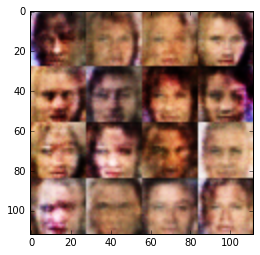

Epoch 0/1... Discriminator Loss: 1.1311... Generator Loss: 0.8419
Epoch 0/1... Discriminator Loss: 0.7743... Generator Loss: 1.2847
Epoch 0/1... Discriminator Loss: 1.0325... Generator Loss: 0.8999
Epoch 0/1... Discriminator Loss: 1.1782... Generator Loss: 0.9075
Epoch 0/1... Discriminator Loss: 1.0297... Generator Loss: 0.9417


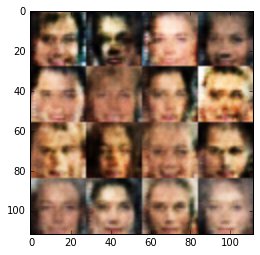

Epoch 0/1... Discriminator Loss: 0.9914... Generator Loss: 1.4111
Epoch 0/1... Discriminator Loss: 1.0403... Generator Loss: 1.3093
Epoch 0/1... Discriminator Loss: 0.9798... Generator Loss: 1.3455
Epoch 0/1... Discriminator Loss: 1.0128... Generator Loss: 1.5442
Epoch 0/1... Discriminator Loss: 1.1425... Generator Loss: 1.0714


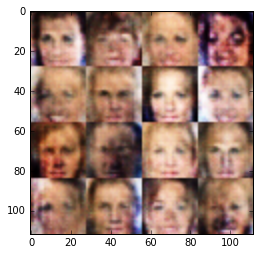

Epoch 0/1... Discriminator Loss: 1.1383... Generator Loss: 0.9032
Epoch 0/1... Discriminator Loss: 1.0965... Generator Loss: 0.8338
Epoch 0/1... Discriminator Loss: 1.1190... Generator Loss: 0.9782
Epoch 0/1... Discriminator Loss: 0.9665... Generator Loss: 1.2659
Epoch 0/1... Discriminator Loss: 0.9670... Generator Loss: 1.0766


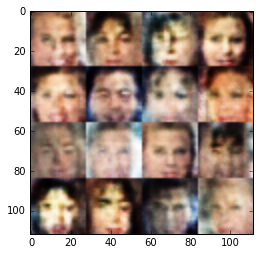

Epoch 0/1... Discriminator Loss: 1.2110... Generator Loss: 0.7185
Epoch 0/1... Discriminator Loss: 1.0638... Generator Loss: 0.9620
Epoch 0/1... Discriminator Loss: 1.1326... Generator Loss: 1.0809
Epoch 0/1... Discriminator Loss: 1.0521... Generator Loss: 1.2870
Epoch 0/1... Discriminator Loss: 0.8966... Generator Loss: 1.4363


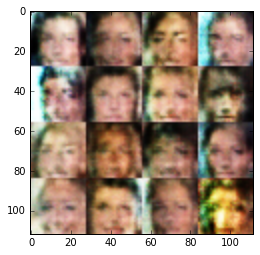

Epoch 0/1... Discriminator Loss: 1.0259... Generator Loss: 1.0772
Epoch 0/1... Discriminator Loss: 1.1028... Generator Loss: 1.2959
Epoch 0/1... Discriminator Loss: 0.8292... Generator Loss: 1.4891
Epoch 0/1... Discriminator Loss: 0.9543... Generator Loss: 1.1826
Epoch 0/1... Discriminator Loss: 1.0861... Generator Loss: 1.0025


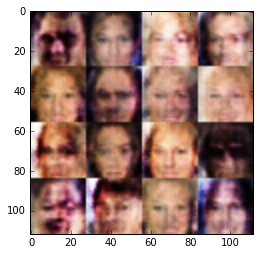

Epoch 0/1... Discriminator Loss: 1.0475... Generator Loss: 1.1511
Epoch 0/1... Discriminator Loss: 1.2122... Generator Loss: 0.8915
Epoch 0/1... Discriminator Loss: 1.2197... Generator Loss: 0.9986
Epoch 0/1... Discriminator Loss: 1.1186... Generator Loss: 1.1052
Epoch 0/1... Discriminator Loss: 0.9980... Generator Loss: 1.1130


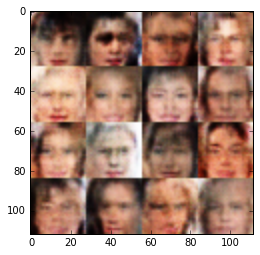

Epoch 0/1... Discriminator Loss: 0.9491... Generator Loss: 1.2939
Epoch 0/1... Discriminator Loss: 1.1697... Generator Loss: 0.7770
Epoch 0/1... Discriminator Loss: 1.0902... Generator Loss: 1.0883
Epoch 0/1... Discriminator Loss: 1.0291... Generator Loss: 1.1614
Epoch 0/1... Discriminator Loss: 1.1999... Generator Loss: 0.7162


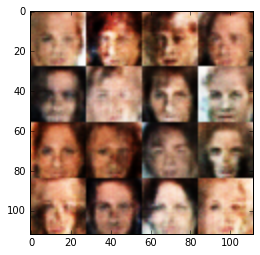

Epoch 0/1... Discriminator Loss: 1.0837... Generator Loss: 1.4113
Epoch 0/1... Discriminator Loss: 1.0008... Generator Loss: 1.1408
Epoch 0/1... Discriminator Loss: 1.1620... Generator Loss: 0.8306
Epoch 0/1... Discriminator Loss: 0.8608... Generator Loss: 1.2120
Epoch 0/1... Discriminator Loss: 1.1082... Generator Loss: 1.2542


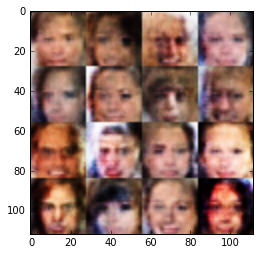

Epoch 0/1... Discriminator Loss: 1.1035... Generator Loss: 0.8374
Epoch 0/1... Discriminator Loss: 1.0956... Generator Loss: 0.9832
Epoch 0/1... Discriminator Loss: 0.9403... Generator Loss: 1.1855
Epoch 0/1... Discriminator Loss: 0.8595... Generator Loss: 1.4308
Epoch 0/1... Discriminator Loss: 1.1080... Generator Loss: 1.3133


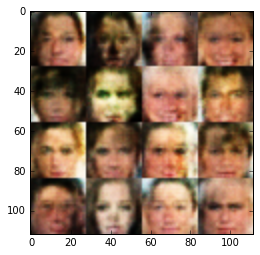

Epoch 0/1... Discriminator Loss: 1.1857... Generator Loss: 0.8073
Epoch 0/1... Discriminator Loss: 0.8887... Generator Loss: 1.4140
Epoch 0/1... Discriminator Loss: 1.2799... Generator Loss: 0.9541
Epoch 0/1... Discriminator Loss: 0.9173... Generator Loss: 1.4711
Epoch 0/1... Discriminator Loss: 0.9558... Generator Loss: 1.3644


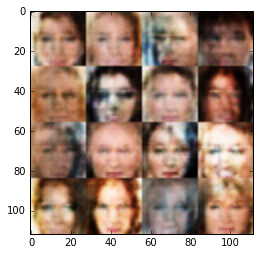

Epoch 0/1... Discriminator Loss: 1.0697... Generator Loss: 1.1250
Epoch 0/1... Discriminator Loss: 1.1012... Generator Loss: 1.0894
Epoch 0/1... Discriminator Loss: 1.0699... Generator Loss: 1.1240
Epoch 0/1... Discriminator Loss: 0.8523... Generator Loss: 1.4630
Epoch 0/1... Discriminator Loss: 1.1556... Generator Loss: 1.0136


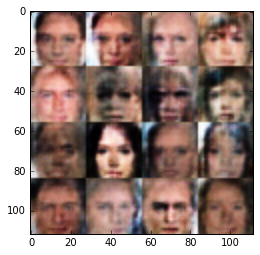

Epoch 0/1... Discriminator Loss: 1.1118... Generator Loss: 1.2125
Epoch 0/1... Discriminator Loss: 0.9015... Generator Loss: 1.2290
Epoch 0/1... Discriminator Loss: 1.1194... Generator Loss: 1.1436
Epoch 0/1... Discriminator Loss: 1.3146... Generator Loss: 0.7607
Epoch 0/1... Discriminator Loss: 1.0734... Generator Loss: 1.0352


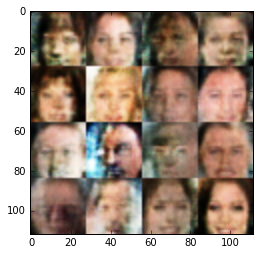

Epoch 0/1... Discriminator Loss: 1.1330... Generator Loss: 1.6736
Epoch 0/1... Discriminator Loss: 0.7845... Generator Loss: 1.4697
Epoch 0/1... Discriminator Loss: 0.8990... Generator Loss: 1.1630
Epoch 0/1... Discriminator Loss: 1.2514... Generator Loss: 0.8198
Epoch 0/1... Discriminator Loss: 1.0382... Generator Loss: 1.0961


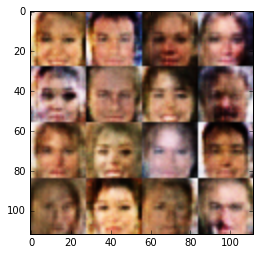

Epoch 0/1... Discriminator Loss: 1.1447... Generator Loss: 0.9614
Epoch 0/1... Discriminator Loss: 1.0120... Generator Loss: 1.1157
Epoch 0/1... Discriminator Loss: 1.3157... Generator Loss: 0.6810
Epoch 0/1... Discriminator Loss: 1.0679... Generator Loss: 1.0387
Epoch 0/1... Discriminator Loss: 0.8339... Generator Loss: 1.5631


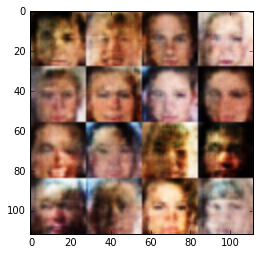

Epoch 0/1... Discriminator Loss: 1.0464... Generator Loss: 0.9602
Epoch 0/1... Discriminator Loss: 0.9972... Generator Loss: 1.2792
Epoch 0/1... Discriminator Loss: 1.1288... Generator Loss: 1.2958
Epoch 0/1... Discriminator Loss: 1.0229... Generator Loss: 1.2989
Epoch 0/1... Discriminator Loss: 1.0221... Generator Loss: 0.8730


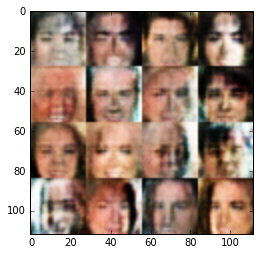

Epoch 0/1... Discriminator Loss: 1.1043... Generator Loss: 0.8063
Epoch 0/1... Discriminator Loss: 1.0415... Generator Loss: 1.3436
Epoch 0/1... Discriminator Loss: 1.1381... Generator Loss: 1.4895
Epoch 0/1... Discriminator Loss: 1.2363... Generator Loss: 0.6559
Epoch 0/1... Discriminator Loss: 1.2504... Generator Loss: 0.7229


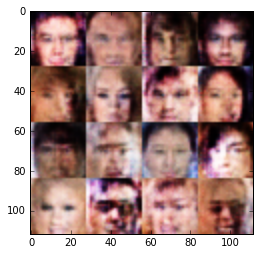

Epoch 0/1... Discriminator Loss: 0.9457... Generator Loss: 1.3738
Epoch 0/1... Discriminator Loss: 1.0266... Generator Loss: 1.0000
Epoch 0/1... Discriminator Loss: 1.0157... Generator Loss: 1.2216
Epoch 0/1... Discriminator Loss: 1.0950... Generator Loss: 0.9742
Epoch 0/1... Discriminator Loss: 1.0517... Generator Loss: 1.4805


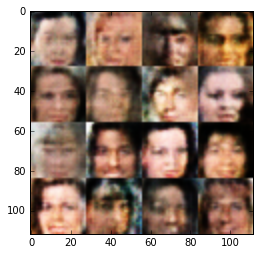

Epoch 0/1... Discriminator Loss: 0.9587... Generator Loss: 1.4533
Epoch 0/1... Discriminator Loss: 1.0321... Generator Loss: 1.6253
Epoch 0/1... Discriminator Loss: 1.1407... Generator Loss: 0.9480
Epoch 0/1... Discriminator Loss: 1.0100... Generator Loss: 1.1137
Epoch 0/1... Discriminator Loss: 0.9490... Generator Loss: 1.4790


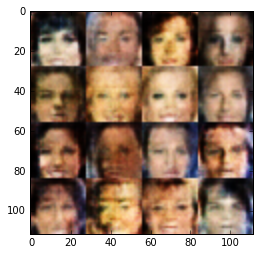

Epoch 0/1... Discriminator Loss: 0.9002... Generator Loss: 1.1845
Epoch 0/1... Discriminator Loss: 1.1907... Generator Loss: 0.7775
Epoch 0/1... Discriminator Loss: 0.8970... Generator Loss: 1.1625
Epoch 0/1... Discriminator Loss: 1.0358... Generator Loss: 0.9763
Epoch 0/1... Discriminator Loss: 0.8361... Generator Loss: 1.6023


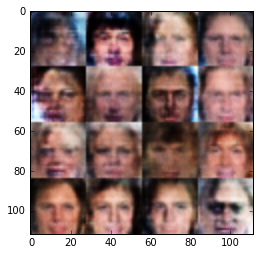

Epoch 0/1... Discriminator Loss: 0.8696... Generator Loss: 1.2136
Epoch 0/1... Discriminator Loss: 1.0621... Generator Loss: 1.2357
Epoch 0/1... Discriminator Loss: 1.2273... Generator Loss: 0.8254
Epoch 0/1... Discriminator Loss: 0.8806... Generator Loss: 1.2026
Epoch 0/1... Discriminator Loss: 1.1656... Generator Loss: 0.9941


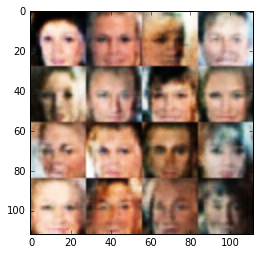

Epoch 0/1... Discriminator Loss: 1.2265... Generator Loss: 0.7390
Epoch 0/1... Discriminator Loss: 1.1295... Generator Loss: 0.8279
Epoch 0/1... Discriminator Loss: 1.2238... Generator Loss: 0.7313
Epoch 0/1... Discriminator Loss: 1.0088... Generator Loss: 1.2391
Epoch 0/1... Discriminator Loss: 0.9960... Generator Loss: 0.9379


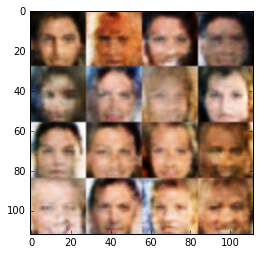

Epoch 0/1... Discriminator Loss: 0.9587... Generator Loss: 1.1252
Epoch 0/1... Discriminator Loss: 1.0007... Generator Loss: 1.1377
Epoch 0/1... Discriminator Loss: 0.8724... Generator Loss: 1.1848
Epoch 0/1... Discriminator Loss: 1.1512... Generator Loss: 0.9470
Epoch 0/1... Discriminator Loss: 1.2694... Generator Loss: 0.6018


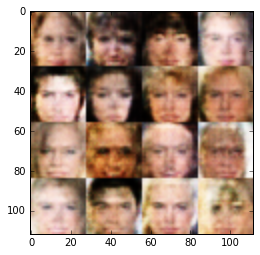

Epoch 0/1... Discriminator Loss: 1.5391... Generator Loss: 0.4702
Epoch 0/1... Discriminator Loss: 1.0400... Generator Loss: 1.0128
Epoch 0/1... Discriminator Loss: 0.9315... Generator Loss: 1.1167
Epoch 0/1... Discriminator Loss: 1.0474... Generator Loss: 1.0342
Epoch 0/1... Discriminator Loss: 1.1194... Generator Loss: 1.1413


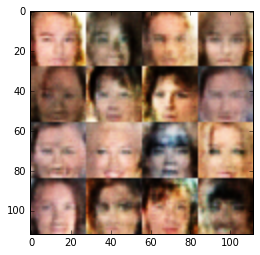

Epoch 0/1... Discriminator Loss: 1.1499... Generator Loss: 1.2345
Epoch 0/1... Discriminator Loss: 1.1074... Generator Loss: 0.9142
Epoch 0/1... Discriminator Loss: 1.0276... Generator Loss: 0.9969
Epoch 0/1... Discriminator Loss: 1.1219... Generator Loss: 0.8598
Epoch 0/1... Discriminator Loss: 1.0663... Generator Loss: 0.9216


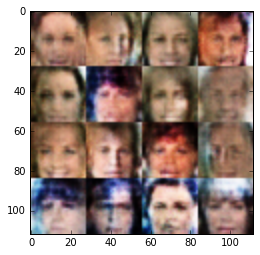

Epoch 0/1... Discriminator Loss: 1.0170... Generator Loss: 1.2739
Epoch 0/1... Discriminator Loss: 1.0547... Generator Loss: 1.0770
Epoch 0/1... Discriminator Loss: 1.0744... Generator Loss: 1.0605
Epoch 0/1... Discriminator Loss: 1.0707... Generator Loss: 0.9499
Epoch 0/1... Discriminator Loss: 1.1244... Generator Loss: 1.0612


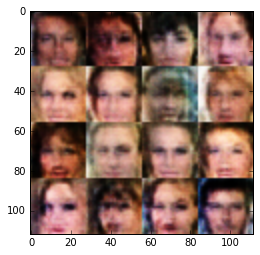

Epoch 0/1... Discriminator Loss: 1.1361... Generator Loss: 0.7738
Epoch 0/1... Discriminator Loss: 1.1421... Generator Loss: 1.1827
Epoch 0/1... Discriminator Loss: 1.3272... Generator Loss: 0.6001
Epoch 0/1... Discriminator Loss: 0.8762... Generator Loss: 1.5332
Epoch 0/1... Discriminator Loss: 1.0563... Generator Loss: 0.9090


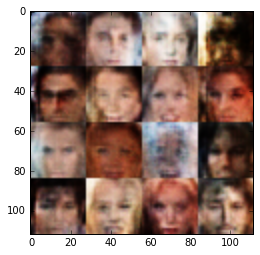

Epoch 0/1... Discriminator Loss: 1.0277... Generator Loss: 0.9768
Epoch 0/1... Discriminator Loss: 0.8769... Generator Loss: 1.1601
Epoch 0/1... Discriminator Loss: 0.9967... Generator Loss: 0.9644
Epoch 0/1... Discriminator Loss: 1.0403... Generator Loss: 1.0977
Epoch 0/1... Discriminator Loss: 1.1532... Generator Loss: 0.9732


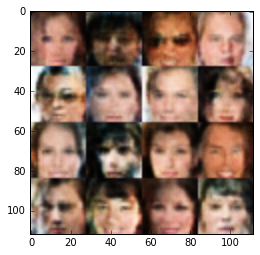

Epoch 0/1... Discriminator Loss: 1.1987... Generator Loss: 0.7970
Epoch 0/1... Discriminator Loss: 1.1483... Generator Loss: 1.0812
Epoch 0/1... Discriminator Loss: 1.3169... Generator Loss: 1.2925
Epoch 0/1... Discriminator Loss: 1.1086... Generator Loss: 0.8347
Epoch 0/1... Discriminator Loss: 1.1150... Generator Loss: 0.9410


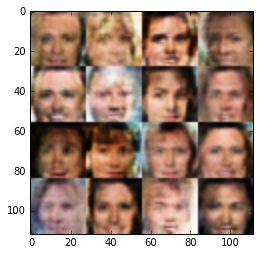

Epoch 0/1... Discriminator Loss: 1.0302... Generator Loss: 0.9472
Epoch 0/1... Discriminator Loss: 0.8972... Generator Loss: 1.7229
Epoch 0/1... Discriminator Loss: 1.0785... Generator Loss: 0.8972
Epoch 0/1... Discriminator Loss: 1.2354... Generator Loss: 0.7200
Epoch 0/1... Discriminator Loss: 1.0850... Generator Loss: 0.9117


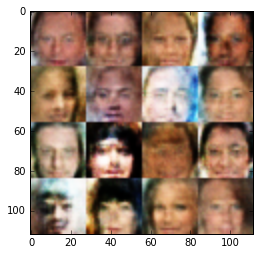

Epoch 0/1... Discriminator Loss: 1.0260... Generator Loss: 1.1614
Epoch 0/1... Discriminator Loss: 1.0944... Generator Loss: 0.8488
Epoch 0/1... Discriminator Loss: 0.9666... Generator Loss: 1.0052
Epoch 0/1... Discriminator Loss: 1.1873... Generator Loss: 0.8844
Epoch 0/1... Discriminator Loss: 0.8741... Generator Loss: 1.3450


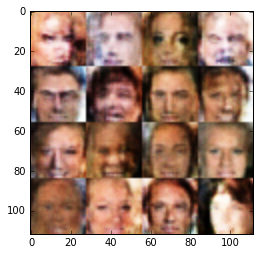

Epoch 0/1... Discriminator Loss: 1.1377... Generator Loss: 1.2947
Epoch 0/1... Discriminator Loss: 1.1853... Generator Loss: 0.7151
Epoch 0/1... Discriminator Loss: 1.1602... Generator Loss: 1.5073
Epoch 0/1... Discriminator Loss: 0.9527... Generator Loss: 1.0595
Epoch 0/1... Discriminator Loss: 1.0783... Generator Loss: 1.0193


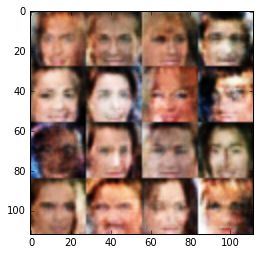

Epoch 0/1... Discriminator Loss: 0.9471... Generator Loss: 1.0947
Epoch 0/1... Discriminator Loss: 0.9370... Generator Loss: 1.5574
Epoch 0/1... Discriminator Loss: 1.1144... Generator Loss: 0.9041
Epoch 0/1... Discriminator Loss: 0.9368... Generator Loss: 1.0595
Epoch 0/1... Discriminator Loss: 1.1103... Generator Loss: 0.8864


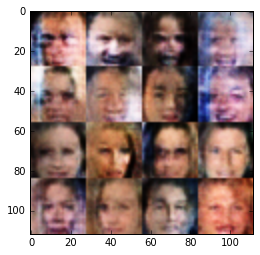

Epoch 0/1... Discriminator Loss: 1.2084... Generator Loss: 0.7530
Epoch 0/1... Discriminator Loss: 1.2155... Generator Loss: 0.7526
Epoch 0/1... Discriminator Loss: 0.9244... Generator Loss: 1.5368
Epoch 0/1... Discriminator Loss: 1.0411... Generator Loss: 1.3534
Epoch 0/1... Discriminator Loss: 1.0200... Generator Loss: 1.0308


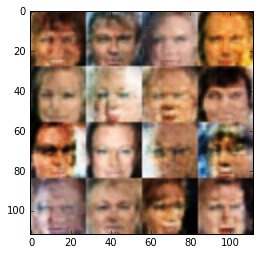

Epoch 0/1... Discriminator Loss: 1.0117... Generator Loss: 1.3240
Epoch 0/1... Discriminator Loss: 1.1240... Generator Loss: 0.9569
Epoch 0/1... Discriminator Loss: 1.0171... Generator Loss: 1.0865
Epoch 0/1... Discriminator Loss: 0.9558... Generator Loss: 1.1293
Epoch 0/1... Discriminator Loss: 1.1070... Generator Loss: 0.8302


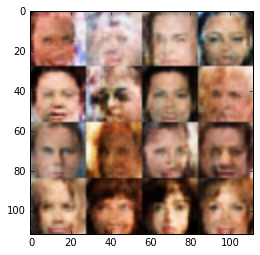

Epoch 0/1... Discriminator Loss: 1.1468... Generator Loss: 0.7894
Epoch 0/1... Discriminator Loss: 0.8927... Generator Loss: 1.0971
Epoch 0/1... Discriminator Loss: 0.9396... Generator Loss: 1.0212
Epoch 0/1... Discriminator Loss: 1.0443... Generator Loss: 1.4028
Epoch 0/1... Discriminator Loss: 0.9600... Generator Loss: 1.0713


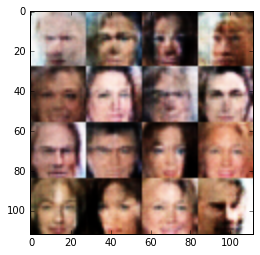

Epoch 0/1... Discriminator Loss: 0.8248... Generator Loss: 1.3223
Epoch 0/1... Discriminator Loss: 0.9061... Generator Loss: 1.2502
Epoch 0/1... Discriminator Loss: 1.0350... Generator Loss: 1.1326
Epoch 0/1... Discriminator Loss: 1.3571... Generator Loss: 0.6973
Epoch 0/1... Discriminator Loss: 0.8877... Generator Loss: 1.2335


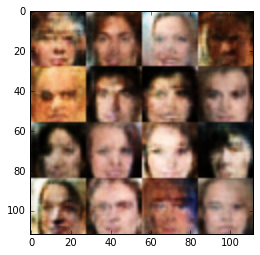

Epoch 0/1... Discriminator Loss: 0.8812... Generator Loss: 1.3339
Epoch 0/1... Discriminator Loss: 1.1523... Generator Loss: 0.8239
Epoch 0/1... Discriminator Loss: 0.8747... Generator Loss: 1.1241
Epoch 0/1... Discriminator Loss: 0.9296... Generator Loss: 1.1883
Epoch 0/1... Discriminator Loss: 1.1918... Generator Loss: 0.9240


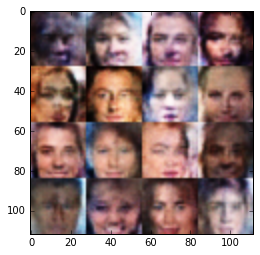

Epoch 0/1... Discriminator Loss: 0.9049... Generator Loss: 1.2963
Epoch 0/1... Discriminator Loss: 0.7855... Generator Loss: 1.4818
Epoch 0/1... Discriminator Loss: 0.8943... Generator Loss: 1.4601
Epoch 0/1... Discriminator Loss: 1.0846... Generator Loss: 1.2054
Epoch 0/1... Discriminator Loss: 0.9393... Generator Loss: 1.0455


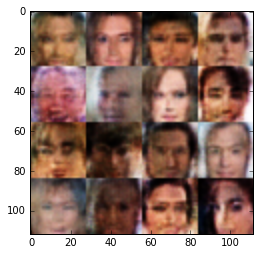

Epoch 0/1... Discriminator Loss: 0.9198... Generator Loss: 1.1896
Epoch 0/1... Discriminator Loss: 1.1476... Generator Loss: 0.8537
Epoch 0/1... Discriminator Loss: 1.2746... Generator Loss: 0.7531
Epoch 0/1... Discriminator Loss: 1.1600... Generator Loss: 0.7625
Epoch 0/1... Discriminator Loss: 0.9304... Generator Loss: 1.5886


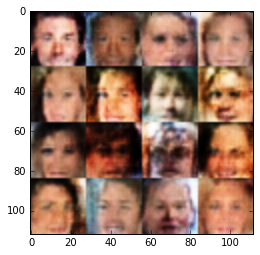

Epoch 0/1... Discriminator Loss: 0.9682... Generator Loss: 1.0325
Epoch 0/1... Discriminator Loss: 1.1921... Generator Loss: 0.8833
Epoch 0/1... Discriminator Loss: 1.1184... Generator Loss: 0.9662
Epoch 0/1... Discriminator Loss: 0.8463... Generator Loss: 1.3256
Epoch 0/1... Discriminator Loss: 1.1524... Generator Loss: 0.7170


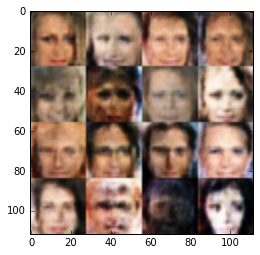

Epoch 0/1... Discriminator Loss: 0.9178... Generator Loss: 1.1450
Epoch 0/1... Discriminator Loss: 0.9250... Generator Loss: 1.3388
Epoch 0/1... Discriminator Loss: 0.9965... Generator Loss: 1.1472
Epoch 0/1... Discriminator Loss: 1.0845... Generator Loss: 1.0061
Epoch 0/1... Discriminator Loss: 0.9413... Generator Loss: 1.2725


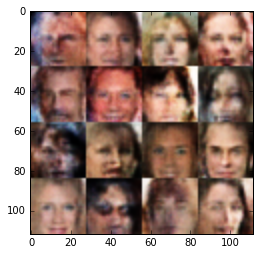

Epoch 0/1... Discriminator Loss: 0.9596... Generator Loss: 1.1859
Epoch 0/1... Discriminator Loss: 0.9851... Generator Loss: 1.4302
Epoch 0/1... Discriminator Loss: 1.0440... Generator Loss: 0.7991
Epoch 0/1... Discriminator Loss: 1.3377... Generator Loss: 0.6775
Epoch 0/1... Discriminator Loss: 0.9340... Generator Loss: 1.0303


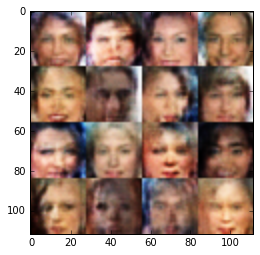

Epoch 0/1... Discriminator Loss: 1.2197... Generator Loss: 0.6768
Epoch 0/1... Discriminator Loss: 0.9559... Generator Loss: 1.2284
Epoch 0/1... Discriminator Loss: 1.0508... Generator Loss: 0.9006
Epoch 0/1... Discriminator Loss: 1.0287... Generator Loss: 0.9696
Epoch 0/1... Discriminator Loss: 1.1531... Generator Loss: 0.8575


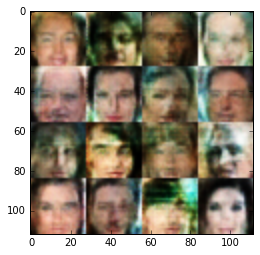

Epoch 0/1... Discriminator Loss: 0.8249... Generator Loss: 1.5210
Epoch 0/1... Discriminator Loss: 0.9606... Generator Loss: 1.1458
Epoch 0/1... Discriminator Loss: 0.9568... Generator Loss: 1.4845
Epoch 0/1... Discriminator Loss: 1.0421... Generator Loss: 1.0003
Epoch 0/1... Discriminator Loss: 1.2099... Generator Loss: 0.7739


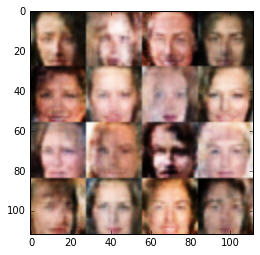

Epoch 0/1... Discriminator Loss: 1.0721... Generator Loss: 0.8343
Epoch 0/1... Discriminator Loss: 0.8512... Generator Loss: 1.5120
Epoch 0/1... Discriminator Loss: 0.9679... Generator Loss: 1.0359
Epoch 0/1... Discriminator Loss: 0.9869... Generator Loss: 1.0371
Epoch 0/1... Discriminator Loss: 1.0859... Generator Loss: 1.0724


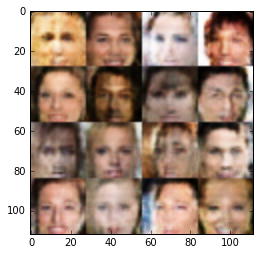

Epoch 0/1... Discriminator Loss: 1.0431... Generator Loss: 1.0766
Epoch 0/1... Discriminator Loss: 1.4602... Generator Loss: 0.5607
Epoch 0/1... Discriminator Loss: 1.2161... Generator Loss: 0.8893
Epoch 0/1... Discriminator Loss: 1.1322... Generator Loss: 0.9878
Epoch 0/1... Discriminator Loss: 1.0968... Generator Loss: 0.9688


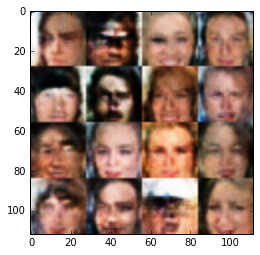

Epoch 0/1... Discriminator Loss: 1.3233... Generator Loss: 0.8055
Epoch 0/1... Discriminator Loss: 1.0959... Generator Loss: 0.9981
Epoch 0/1... Discriminator Loss: 0.9945... Generator Loss: 0.9958
Epoch 0/1... Discriminator Loss: 0.8528... Generator Loss: 1.4304
Epoch 0/1... Discriminator Loss: 0.9536... Generator Loss: 1.0354


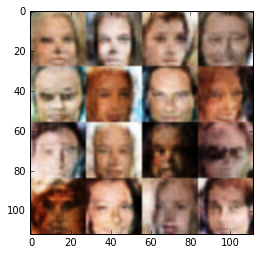

Epoch 0/1... Discriminator Loss: 1.1940... Generator Loss: 0.7293
Epoch 0/1... Discriminator Loss: 1.2113... Generator Loss: 0.9417
Epoch 0/1... Discriminator Loss: 0.7721... Generator Loss: 1.5379
Epoch 0/1... Discriminator Loss: 0.9834... Generator Loss: 0.9462
Epoch 0/1... Discriminator Loss: 1.2530... Generator Loss: 0.8923


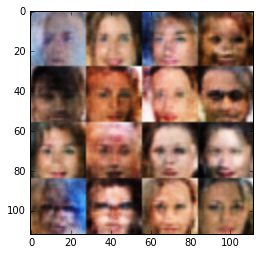

Epoch 0/1... Discriminator Loss: 1.1176... Generator Loss: 0.8378
Epoch 0/1... Discriminator Loss: 0.8529... Generator Loss: 1.3780
Epoch 0/1... Discriminator Loss: 1.1143... Generator Loss: 1.0085
Epoch 0/1... Discriminator Loss: 1.1047... Generator Loss: 0.9741
Epoch 0/1... Discriminator Loss: 1.1101... Generator Loss: 1.1830


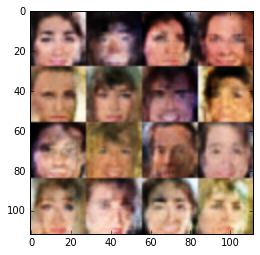

Epoch 0/1... Discriminator Loss: 0.9619... Generator Loss: 0.9938
Epoch 0/1... Discriminator Loss: 1.0647... Generator Loss: 1.3296
Epoch 0/1... Discriminator Loss: 0.9373... Generator Loss: 1.0433
Epoch 0/1... Discriminator Loss: 0.8253... Generator Loss: 1.2627
Epoch 0/1... Discriminator Loss: 0.7949... Generator Loss: 1.6757


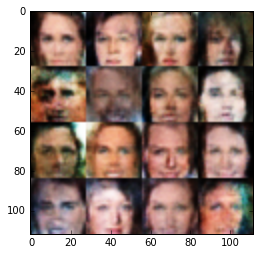

Epoch 0/1... Discriminator Loss: 0.9380... Generator Loss: 1.0696
Epoch 0/1... Discriminator Loss: 1.1306... Generator Loss: 0.8049
Epoch 0/1... Discriminator Loss: 0.9598... Generator Loss: 1.0327
Epoch 0/1... Discriminator Loss: 0.9030... Generator Loss: 1.0511
Epoch 0/1... Discriminator Loss: 1.0211... Generator Loss: 1.0283


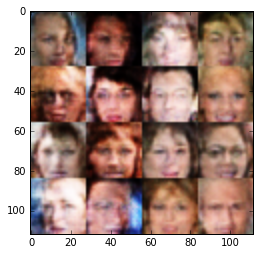

Epoch 0/1... Discriminator Loss: 1.0416... Generator Loss: 1.1850
Epoch 0/1... Discriminator Loss: 1.0960... Generator Loss: 0.8888
Epoch 0/1... Discriminator Loss: 0.8407... Generator Loss: 1.1774
Epoch 0/1... Discriminator Loss: 1.1028... Generator Loss: 0.9387
Epoch 0/1... Discriminator Loss: 1.2525... Generator Loss: 0.7776


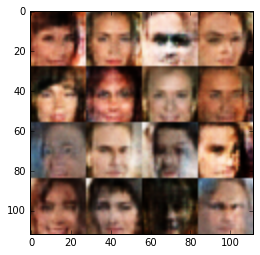

Epoch 0/1... Discriminator Loss: 0.9296... Generator Loss: 1.1811
Epoch 0/1... Discriminator Loss: 1.0015... Generator Loss: 0.9213
Epoch 0/1... Discriminator Loss: 1.0718... Generator Loss: 1.0638
Epoch 0/1... Discriminator Loss: 0.8987... Generator Loss: 1.0782
Epoch 0/1... Discriminator Loss: 1.0338... Generator Loss: 1.0075


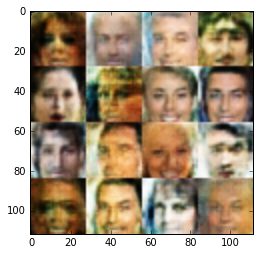

Epoch 0/1... Discriminator Loss: 0.8570... Generator Loss: 1.2820
Epoch 0/1... Discriminator Loss: 0.9916... Generator Loss: 1.0173
Epoch 0/1... Discriminator Loss: 1.0920... Generator Loss: 1.3936
Epoch 0/1... Discriminator Loss: 0.9119... Generator Loss: 1.0833
Epoch 0/1... Discriminator Loss: 1.0226... Generator Loss: 1.0195


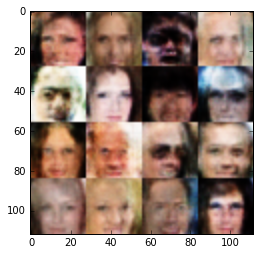

Epoch 0/1... Discriminator Loss: 0.8709... Generator Loss: 1.3472
Epoch 0/1... Discriminator Loss: 1.0627... Generator Loss: 0.9289
Epoch 0/1... Discriminator Loss: 0.9878... Generator Loss: 1.0537
Epoch 0/1... Discriminator Loss: 1.0247... Generator Loss: 1.4718
Epoch 0/1... Discriminator Loss: 1.3153... Generator Loss: 0.6523


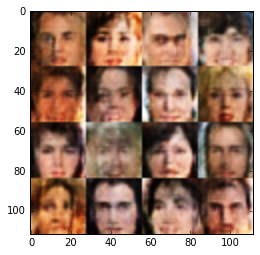

Epoch 0/1... Discriminator Loss: 0.9824... Generator Loss: 1.2982
Epoch 0/1... Discriminator Loss: 1.2435... Generator Loss: 0.6542
Epoch 0/1... Discriminator Loss: 0.9869... Generator Loss: 1.0847
Epoch 0/1... Discriminator Loss: 1.0718... Generator Loss: 0.8400
Epoch 0/1... Discriminator Loss: 0.8692... Generator Loss: 1.1997


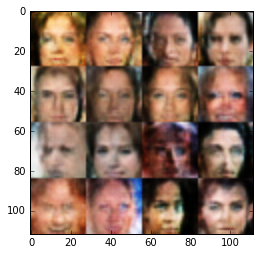

Epoch 0/1... Discriminator Loss: 1.1122... Generator Loss: 0.8380
Epoch 0/1... Discriminator Loss: 1.1118... Generator Loss: 0.8747
Epoch 0/1... Discriminator Loss: 1.1871... Generator Loss: 0.7892
Epoch 0/1... Discriminator Loss: 0.8674... Generator Loss: 1.4996
Epoch 0/1... Discriminator Loss: 1.0085... Generator Loss: 1.3276


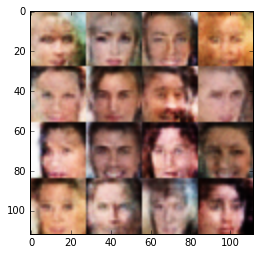

Epoch 0/1... Discriminator Loss: 0.8983... Generator Loss: 1.0999
Epoch 0/1... Discriminator Loss: 1.0539... Generator Loss: 0.9946
Epoch 0/1... Discriminator Loss: 1.0601... Generator Loss: 0.9923
Epoch 0/1... Discriminator Loss: 0.9472... Generator Loss: 1.0456
Epoch 0/1... Discriminator Loss: 1.0887... Generator Loss: 0.8348


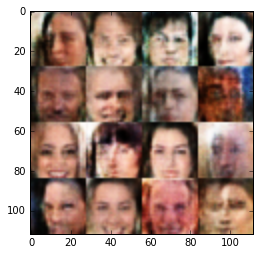

Epoch 0/1... Discriminator Loss: 0.9930... Generator Loss: 1.0191
Epoch 0/1... Discriminator Loss: 1.1097... Generator Loss: 0.7759
Epoch 0/1... Discriminator Loss: 1.2296... Generator Loss: 0.7270
Epoch 0/1... Discriminator Loss: 1.0124... Generator Loss: 0.9465
Epoch 0/1... Discriminator Loss: 1.1923... Generator Loss: 0.6939


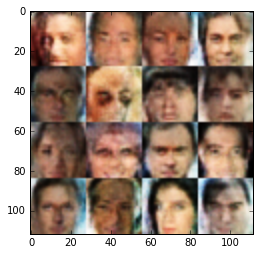

Epoch 0/1... Discriminator Loss: 0.9684... Generator Loss: 1.0445
Epoch 0/1... Discriminator Loss: 1.0054... Generator Loss: 1.3746
Epoch 0/1... Discriminator Loss: 1.0341... Generator Loss: 1.0809
Epoch 0/1... Discriminator Loss: 1.1129... Generator Loss: 1.3498
Epoch 0/1... Discriminator Loss: 1.0282... Generator Loss: 0.8764


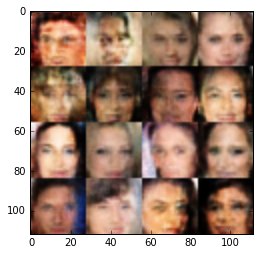

Epoch 0/1... Discriminator Loss: 1.0565... Generator Loss: 1.3069
Epoch 0/1... Discriminator Loss: 1.2467... Generator Loss: 0.8769
Epoch 0/1... Discriminator Loss: 0.8936... Generator Loss: 1.2728
Epoch 0/1... Discriminator Loss: 1.1724... Generator Loss: 0.7364
Epoch 0/1... Discriminator Loss: 1.2134... Generator Loss: 0.9109


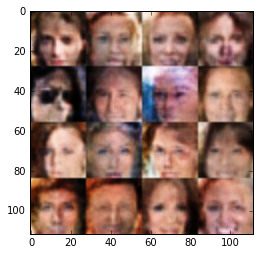

Epoch 0/1... Discriminator Loss: 1.0282... Generator Loss: 0.8799
Epoch 0/1... Discriminator Loss: 0.9149... Generator Loss: 1.1921
Epoch 0/1... Discriminator Loss: 1.0743... Generator Loss: 0.9433
Epoch 0/1... Discriminator Loss: 0.9674... Generator Loss: 1.3275
Epoch 0/1... Discriminator Loss: 1.0388... Generator Loss: 1.0472


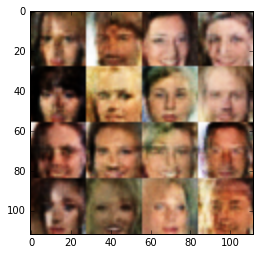

Epoch 0/1... Discriminator Loss: 1.0261... Generator Loss: 0.9354
Epoch 0/1... Discriminator Loss: 0.9393... Generator Loss: 1.0687
Epoch 0/1... Discriminator Loss: 0.9790... Generator Loss: 1.4435
Epoch 0/1... Discriminator Loss: 1.1507... Generator Loss: 0.7928
Epoch 0/1... Discriminator Loss: 1.1590... Generator Loss: 0.9210


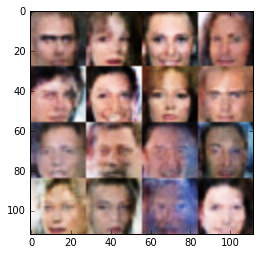

Epoch 0/1... Discriminator Loss: 1.0971... Generator Loss: 0.9119
Epoch 0/1... Discriminator Loss: 0.9913... Generator Loss: 1.0117
Epoch 0/1... Discriminator Loss: 0.8266... Generator Loss: 1.3761
Epoch 0/1... Discriminator Loss: 1.0641... Generator Loss: 0.9092
Epoch 0/1... Discriminator Loss: 1.1060... Generator Loss: 0.8883


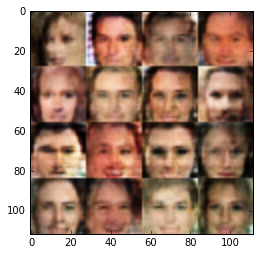

Epoch 0/1... Discriminator Loss: 1.0476... Generator Loss: 1.3472
Epoch 0/1... Discriminator Loss: 0.9729... Generator Loss: 1.1707
Epoch 0/1... Discriminator Loss: 0.9939... Generator Loss: 1.3915
Epoch 0/1... Discriminator Loss: 1.0757... Generator Loss: 1.0139
Epoch 0/1... Discriminator Loss: 1.2516... Generator Loss: 0.8078


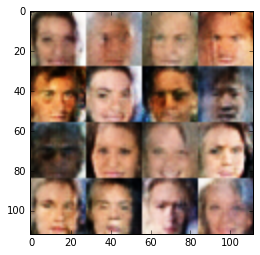

Epoch 0/1... Discriminator Loss: 1.0813... Generator Loss: 1.1905
Epoch 0/1... Discriminator Loss: 1.2431... Generator Loss: 0.7476
Epoch 0/1... Discriminator Loss: 1.0442... Generator Loss: 1.0592
Epoch 0/1... Discriminator Loss: 0.9762... Generator Loss: 1.2362
Epoch 0/1... Discriminator Loss: 0.9960... Generator Loss: 0.9139


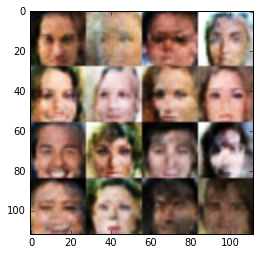

Epoch 0/1... Discriminator Loss: 0.8873... Generator Loss: 1.0773
Epoch 0/1... Discriminator Loss: 0.8765... Generator Loss: 1.2213
Epoch 0/1... Discriminator Loss: 0.8990... Generator Loss: 1.1370
Epoch 0/1... Discriminator Loss: 0.9918... Generator Loss: 1.0533
Epoch 0/1... Discriminator Loss: 1.1437... Generator Loss: 1.0114


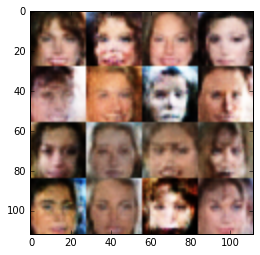

Epoch 0/1... Discriminator Loss: 0.9813... Generator Loss: 1.1198
Epoch 0/1... Discriminator Loss: 1.2056... Generator Loss: 0.7880
Epoch 0/1... Discriminator Loss: 0.8466... Generator Loss: 1.3409
Epoch 0/1... Discriminator Loss: 1.3547... Generator Loss: 0.7180
Epoch 0/1... Discriminator Loss: 1.1881... Generator Loss: 0.6971


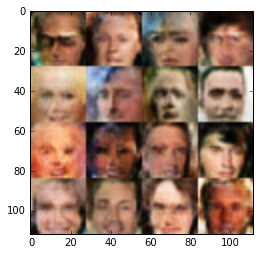

Epoch 0/1... Discriminator Loss: 1.0901... Generator Loss: 0.8541
Epoch 0/1... Discriminator Loss: 1.2865... Generator Loss: 0.7340
Epoch 0/1... Discriminator Loss: 1.1354... Generator Loss: 0.9881
Epoch 0/1... Discriminator Loss: 1.2004... Generator Loss: 0.8042
Epoch 0/1... Discriminator Loss: 1.1060... Generator Loss: 1.0147


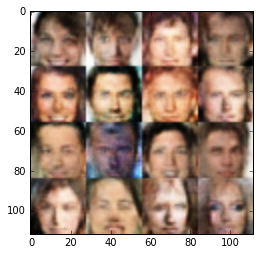

Epoch 0/1... Discriminator Loss: 1.0165... Generator Loss: 0.9677
Epoch 0/1... Discriminator Loss: 0.9593... Generator Loss: 1.3959
Epoch 0/1... Discriminator Loss: 0.9132... Generator Loss: 1.1374
Epoch 0/1... Discriminator Loss: 1.1815... Generator Loss: 0.7516
Epoch 0/1... Discriminator Loss: 1.1518... Generator Loss: 0.7362


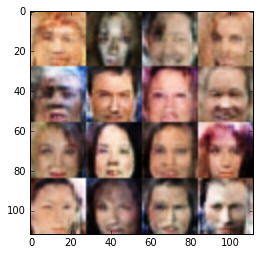

Epoch 0/1... Discriminator Loss: 0.9858... Generator Loss: 1.1614
Epoch 0/1... Discriminator Loss: 1.1606... Generator Loss: 0.6804
Epoch 0/1... Discriminator Loss: 1.4574... Generator Loss: 0.4505
Epoch 0/1... Discriminator Loss: 1.0854... Generator Loss: 1.0226
Epoch 0/1... Discriminator Loss: 1.0615... Generator Loss: 1.4103


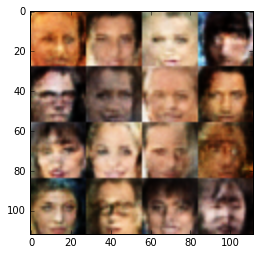

Epoch 0/1... Discriminator Loss: 0.9971... Generator Loss: 1.0223
Epoch 0/1... Discriminator Loss: 0.8712... Generator Loss: 1.2361
Epoch 0/1... Discriminator Loss: 1.0126... Generator Loss: 0.9810
Epoch 0/1... Discriminator Loss: 1.0285... Generator Loss: 1.6625
Epoch 0/1... Discriminator Loss: 1.0622... Generator Loss: 0.9892


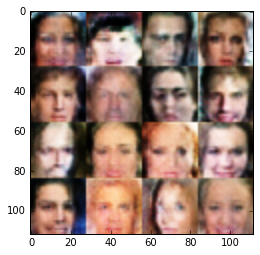

Epoch 0/1... Discriminator Loss: 0.9451... Generator Loss: 1.2043
Epoch 0/1... Discriminator Loss: 0.9031... Generator Loss: 1.4389
Epoch 0/1... Discriminator Loss: 0.8066... Generator Loss: 1.2502
Epoch 0/1... Discriminator Loss: 1.2577... Generator Loss: 0.7548
Epoch 0/1... Discriminator Loss: 1.1847... Generator Loss: 0.8556


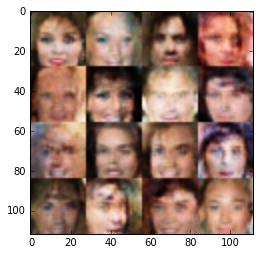

Epoch 0/1... Discriminator Loss: 1.2152... Generator Loss: 0.9872
Epoch 0/1... Discriminator Loss: 1.0081... Generator Loss: 0.9452
Epoch 0/1... Discriminator Loss: 1.0657... Generator Loss: 0.9807
Epoch 0/1... Discriminator Loss: 0.9007... Generator Loss: 1.2229
Epoch 0/1... Discriminator Loss: 1.1185... Generator Loss: 0.8236


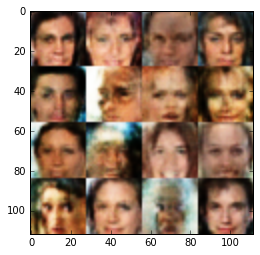

Epoch 0/1... Discriminator Loss: 1.1625... Generator Loss: 0.7481
Epoch 0/1... Discriminator Loss: 0.8313... Generator Loss: 1.4100
Epoch 0/1... Discriminator Loss: 1.1402... Generator Loss: 0.7810
Epoch 0/1... Discriminator Loss: 1.0898... Generator Loss: 0.8671
Epoch 0/1... Discriminator Loss: 0.8460... Generator Loss: 1.2928


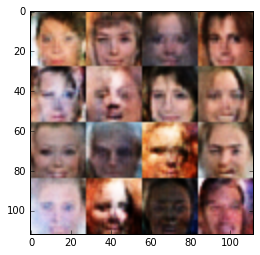

Epoch 0/1... Discriminator Loss: 0.9598... Generator Loss: 1.0024
Epoch 0/1... Discriminator Loss: 0.9762... Generator Loss: 1.3605
Epoch 0/1... Discriminator Loss: 1.0325... Generator Loss: 1.2059
Epoch 0/1... Discriminator Loss: 0.9792... Generator Loss: 1.1105
Epoch 0/1... Discriminator Loss: 0.9742... Generator Loss: 1.1726


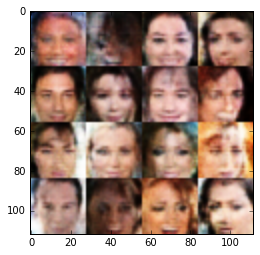

Epoch 0/1... Discriminator Loss: 1.0188... Generator Loss: 1.5268
Epoch 0/1... Discriminator Loss: 1.0125... Generator Loss: 1.4617
Epoch 0/1... Discriminator Loss: 0.8017... Generator Loss: 1.5033
Epoch 0/1... Discriminator Loss: 0.9696... Generator Loss: 1.1925
Epoch 0/1... Discriminator Loss: 0.7855... Generator Loss: 1.4051


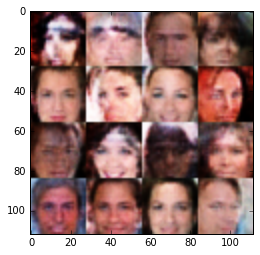

Epoch 0/1... Discriminator Loss: 1.3119... Generator Loss: 0.5693
Epoch 0/1... Discriminator Loss: 0.9957... Generator Loss: 0.8957
Epoch 0/1... Discriminator Loss: 1.0270... Generator Loss: 1.2770
Epoch 0/1... Discriminator Loss: 1.0526... Generator Loss: 1.0924
Epoch 0/1... Discriminator Loss: 1.3914... Generator Loss: 0.5657


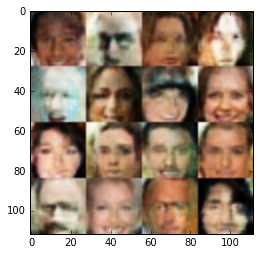

Epoch 0/1... Discriminator Loss: 1.3380... Generator Loss: 0.6049
Epoch 0/1... Discriminator Loss: 1.0921... Generator Loss: 0.8421
Epoch 0/1... Discriminator Loss: 0.9544... Generator Loss: 1.1659
Epoch 0/1... Discriminator Loss: 0.9063... Generator Loss: 1.0698
Epoch 0/1... Discriminator Loss: 1.0021... Generator Loss: 0.8192


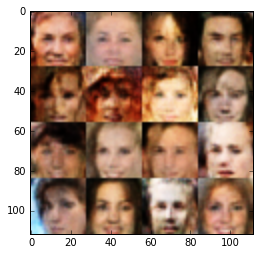

Epoch 0/1... Discriminator Loss: 1.0855... Generator Loss: 1.0033
Epoch 0/1... Discriminator Loss: 0.9743... Generator Loss: 1.1047
Epoch 0/1... Discriminator Loss: 0.8903... Generator Loss: 1.2241
Epoch 0/1... Discriminator Loss: 1.0959... Generator Loss: 0.8693
Epoch 0/1... Discriminator Loss: 1.1094... Generator Loss: 0.7912


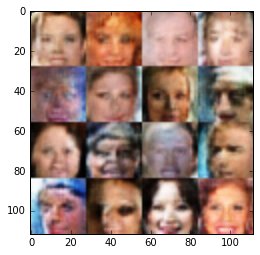

Epoch 0/1... Discriminator Loss: 1.1664... Generator Loss: 0.7296
Epoch 0/1... Discriminator Loss: 1.0264... Generator Loss: 0.8916
Epoch 0/1... Discriminator Loss: 1.0169... Generator Loss: 1.0712
Epoch 0/1... Discriminator Loss: 0.9759... Generator Loss: 1.2022
Epoch 0/1... Discriminator Loss: 0.9497... Generator Loss: 0.9450


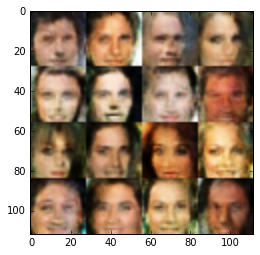

Epoch 0/1... Discriminator Loss: 1.0004... Generator Loss: 0.9537
Epoch 0/1... Discriminator Loss: 0.9829... Generator Loss: 0.9504
Epoch 0/1... Discriminator Loss: 0.9932... Generator Loss: 0.9849
Epoch 0/1... Discriminator Loss: 1.0168... Generator Loss: 1.3260
Epoch 0/1... Discriminator Loss: 0.9331... Generator Loss: 1.3815


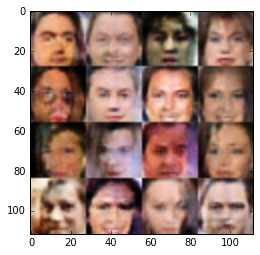

Epoch 0/1... Discriminator Loss: 1.2366... Generator Loss: 0.6851
Epoch 0/1... Discriminator Loss: 1.0025... Generator Loss: 1.0455
Epoch 0/1... Discriminator Loss: 1.2760... Generator Loss: 0.6199
Epoch 0/1... Discriminator Loss: 0.9011... Generator Loss: 1.1296
Epoch 0/1... Discriminator Loss: 0.9976... Generator Loss: 1.0478


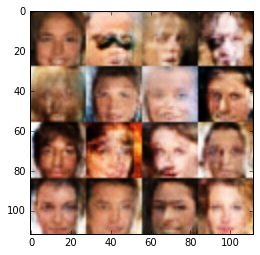

Epoch 0/1... Discriminator Loss: 1.1256... Generator Loss: 0.9277
Epoch 0/1... Discriminator Loss: 1.1149... Generator Loss: 0.8588
Epoch 0/1... Discriminator Loss: 1.3072... Generator Loss: 0.6472
Epoch 0/1... Discriminator Loss: 0.7487... Generator Loss: 1.7373
Epoch 0/1... Discriminator Loss: 0.9950... Generator Loss: 0.9921


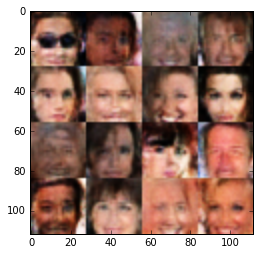

Epoch 0/1... Discriminator Loss: 1.1793... Generator Loss: 0.9551
Epoch 0/1... Discriminator Loss: 0.8461... Generator Loss: 1.5322
Epoch 0/1... Discriminator Loss: 0.9459... Generator Loss: 1.1411
Epoch 0/1... Discriminator Loss: 0.7982... Generator Loss: 1.2642


In [25]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.